In [1]:
## 2026.02.11 using FineST env
## 2026.02.12 vilization cell type of each ROI
## 2026.03.04 woody_pro:: upload the HE-StarDist embedding and predict the cell type of NCRT_tumor1  
## 2026.03.06 woody_pro:: clearn code 
## 2026.03.13 update cell type level1: nanually make codex_meta_celltype_level1.csv 
## 2026.03.16 use valis to make registration [dont try]
## 2026.03.18 delete two subtypes, adjust scale factor by batch
## 2026.03.19 Train and using NCRT_train.ipynb
## 2026.03.23 Adjust file name and path, then adjust model to use level1 and level2, make model_train_validate.ipynb
## 2026.04.04 woody_pro: SeededNTM; make processing for x, add cv in training for tumor1
## 2026.04.06 Adjust loss function
## 2026.04.14 LLY update using UNI method, based on LOGO CV
## 2026.05.11 Use codex_meta_celltype_level012.csv, run Data_process_visualization.ipynb and demo_level012.sh, 
##            to get he_cell_coords/ and matched_features_tumor1_level012.npz
## 2026.05.11 add the prediction form Level1 directly
## 2026.06.11 back from Xenium, and plot AUC, 

In [29]:
import os
# Before other imports: PyTorch/torch.distributed may use /tmp; set NCRT_TMPDIR if quota is tight.
_nrtc_tmp = os.environ.get("NCRT_TMPDIR", os.path.join(os.path.expanduser("~"), "ssd2", "tmp"))
try:
    os.makedirs(_nrtc_tmp, exist_ok=True)
    os.environ["TMPDIR"] = _nrtc_tmp
    os.environ["TEMP"] = _nrtc_tmp
    os.environ["TMP"] = _nrtc_tmp
    import tempfile as _tf_nb
    _tf_nb.tempdir = _nrtc_tmp
except OSError:
    pass

import sys
import importlib
import pandas as pd
from pathlib import Path

## Add the code directory to Python path
path = '/home/lingyu/ssd2/Python/'
code_dir = f'{path}Hist2Pheno/code/Hist2Pheno_pkg/'
if code_dir not in sys.path:
    sys.path.insert(0, code_dir)

_ncrt_code_dir = f'{path}Hist2Pheno/code/CODEX_escc/'
if _ncrt_code_dir not in sys.path:
    sys.path.insert(0, _ncrt_code_dir)

## Import (or reload) base module
# Do NOT `import model` — that binds the name ``model`` to the *module* and will shadow
# your trained ``torch.nn.Module`` after ``globals().update(LP)`` when this cell is re-run.
import base
import plot
import model as model_pkg
## Impost：Force reload base.py
importlib.reload(base)
importlib.reload(plot)
importlib.reload(model_pkg)

import ncrt_uni_nb_helpers as ncrt_nb
importlib.reload(ncrt_nb)
from ncrt_uni_nb_helpers import (
    ensure_lp_extra_insample_preds,
    stardist_head_preds,
    plot_he_confusion_matrices,
    plot_he_spatial_extra_tiers,
    plot_he_f1_extra_tiers,
    build_insample_tier_metrics,
    plot_stardist_spatial_extra,
    plot_stardist_acc_extra,
    plot_stardist_confusion_extra,
    plot_stardist_f1_extra,
    plot_stardist_roc_extra,
    plot_he_roc_extra,
    alias_ncrt_hierarchy_labels,
    ensure_stardist_hierarchy_labels,
)


## Re-import the function (otherwise, still be old_version).
from base import (
    get_celltype_coords,
    divide_into_rois_by_parent,
    get_pixel_size,
    visualize_roi_cells,
    visualize_all_rois_with_he,
    visualize_all_rois,
    extract_and_save_celltype_by_tumorid,
    transformation_matrix_properties,
    invert_transformation_matrix,
    align_pcf_to_he_coordinates,
    add_pixel_coords,
    verify_transformation_alignment,
    merge_coordinates,
    analyze_and_filter_classes_by_gap,
    ImprovedMLPClassifier,
    load_embeddings,
    match_embeddings,
    prepare_matched_embeddings,
    evaluate,
    create_dataloaders,
    train_model,
    CellTypeDataset,
    evaluate_and_plot_on_all_data,
    align_matrix,
    match_StarCoords2ROI,
    match_celltype2stardist,
    merge_celltype_level12,
    make_PCF2HE_alignment,
    load_cell_pixcoords,load_hist_embeddings,
    match_hist2cell_matrix,
    make_PCF2HE2StarDist_alignment,
    save_hce_validation_metrics,
    collect_hce_tier_metrics_extras,
    split_train_test,
    prepare_data_leave_one_group_out,
    spatial_tile_groups_for_logo,
    loader_train_test,
    first_pth_tensor
    
)

from plot import (
    plot_celltype_distribution,
    visualize_all_celltype_distributions,
    plot_celltype_spatial_distribution,
    plot_PCF_HE_counts,
    plot_WSI_counts,
    plot_cell_area_histogram,
    plot_confusion_matrix,
    plot_level1_spatial_distribution,
    plot_tier_spatial_distribution,
    plot_per_class_f1,
    plot_per_class_accuracy,
    plot_level1_accuracy_from_level2_predictions,
    mlp_collect_softmax_probs,
    mlp_collect_five_head_softmax_probs,
    plot_multiclass_roc_curves,
    plot_level1_roc_from_level2_scores,
    plot_level1_f1_from_level2_predictions,
    plot_level1_accuracy_from_level1_head,
    plot_level1_f1_from_level1_head,
    plot_level1_roc_from_level1_head,
)

from model import (
    build_mlp_classifier,
    get_best_checkpoint_path,
    sync_best_mlp_from_logo_fold,
    train_and_save_model,
    infer_input_dim_and_num_classes,
    mode_validation,
    load_model_for_predict,
    train_and_save_model_from_split,
    mode_validation_from_split,
    train_hce_leave_one_group_out_cv,
    run_logo_cv_and_load_best_model,
    report_logo_cv_means_and_insample_eval,
    run_logo_cv_with_insample_report,
    run_stratified_kfold_cv_with_insample_report,
    predict_all_label_heads,
)

## Import HAS_OPENSLIDE and HAS_TIFFFILE from base module for use in notebook
HAS_OPENSLIDE = base.HAS_OPENSLIDE
HAS_TIFFFILE = base.HAS_TIFFFILE

## Also import openslide module if available (needed for direct use in some cells)
if HAS_OPENSLIDE:
    import openslide
else:
    openslide = None

try:
    import tifffile
except ImportError:
    tifffile = None

print("Successfully reloaded functions from base.py")
print(f"openslide: {HAS_OPENSLIDE}, tifffile: {HAS_TIFFFILE}")


## reset pathway
os.chdir(f'{path}Hist2Pheno/data/CODEX/ESCC')
therapy_data = 'NCRT'
image_feature = f'sc_{therapy_data}'
# therapy_model = f'{therapy_data}_project_tumor1'
therapy_model = f'{therapy_data}_project_tumor1_UNI'
segment_data1 = f'{therapy_data}_project - seg 1-14'
segment_data2 = f'{therapy_data}_project - seg 15-28'
export_data = 'export'
save_result = 'result'

stardist_data = 'StarDist_Segment'
transfer_data = 'he_cell_coords'
qupath_corner = 'QupathCorners'

_result_dir = f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/{save_result}"

FIG = {
    "conf_matrix_level2": "conf_matrix_level2.pdf",
    "conf_matrix_level1": "conf_matrix_level1.pdf",
    "conf_matrix_level1_L1head": "conf_matrix_level1_L1head.pdf",
    "conf_matrix_level12": "conf_matrix_level12.pdf",
    "conf_matrix_level0": "conf_matrix_level0.pdf",
    "conf_matrix_level01": "conf_matrix_level01.pdf",
    "f1_perclass_level2": "f1_perclass_level2.pdf",
    "f1_perclass_level1": "f1_perclass_level1.pdf",
    "f1_perclass_level1_L1head": "f1_perclass_level1_L1head.pdf",
    "f1_perclass_level12": "f1_perclass_level12.pdf",
    "f1_perclass_level0": "f1_perclass_level0.pdf",
    "f1_perclass_level01": "f1_perclass_level01.pdf",
    "celltype_valid_level2": "celltype_valid_level2.jpg",
    "celltype_true_level2": "celltype_true_level2.jpg",
    "celltype_valid_level1": "celltype_valid_level1.jpg",
    "celltype_true_level1": "celltype_true_level1.jpg",
    "celltype_valid_level12": "celltype_valid_level12.jpg",
    "celltype_true_level12": "celltype_true_level12.jpg",
    "celltype_valid_level0": "celltype_valid_level0.jpg",
    "celltype_true_level0": "celltype_true_level0.jpg",
    "celltype_valid_level01": "celltype_valid_level01.jpg",
    "celltype_true_level01": "celltype_true_level01.jpg",
    "validation_internal_metrics": "validation_internal_metrics.csv",
    "stardist_pred_level2": "celltype_pred_stardist_level2.jpg",
    "stardist_true_level2": "celltype_true_stardist_level2.jpg",
    "stardist_pred_level1": "celltype_pred_stardist_level1.jpg",
    "stardist_true_level1": "celltype_true_stardist_level1.jpg",
    "stardist_pred_level12": "celltype_pred_stardist_level12.jpg",
    "stardist_true_level12": "celltype_true_stardist_level12.jpg",
    "stardist_pred_level0": "celltype_pred_stardist_level0.jpg",
    "stardist_true_level0": "celltype_true_stardist_level0.jpg",
    "stardist_pred_level01": "celltype_pred_stardist_level01.jpg",
    "stardist_true_level01": "celltype_true_stardist_level01.jpg",
    "acc_level2_stardist": "acc_level2_stardist.pdf",
    "acc_level1_stardist": "acc_level1_stardist.pdf",
    "acc_level1_stardist_L1head": "acc_level1_stardist_L1head.pdf",
    "acc_level12_stardist": "acc_level12_stardist.pdf",
    "acc_level0_stardist": "acc_level0_stardist.pdf",
    "acc_level01_stardist": "acc_level01_stardist.pdf",
    "conf_matrix_level2_stardist": "conf_matrix_level2_stardist.pdf",
    "conf_matrix_level1_stardist": "conf_matrix_level1_stardist.pdf",
    "conf_matrix_level12_stardist": "conf_matrix_level12_stardist.pdf",
    "conf_matrix_level0_stardist": "conf_matrix_level0_stardist.pdf",
    "conf_matrix_level01_stardist": "conf_matrix_level01_stardist.pdf",
    "f1_level2_stardist": "f1_level2_stardist.pdf",
    "f1_level1_stardist": "f1_level1_stardist.pdf",
    "f1_level1_stardist_L1head": "f1_level1_stardist_L1head.pdf",
    "f1_level12_stardist": "f1_level12_stardist.pdf",
    "f1_level0_stardist": "f1_level0_stardist.pdf",
    "f1_level01_stardist": "f1_level01_stardist.pdf",
    "roc_stardist_level2": "roc_stardist_level2.pdf",
    "roc_stardist_level1": "roc_stardist_level1.pdf",
    "roc_stardist_level1_L1head": "roc_stardist_level1_L1head.pdf",
    "roc_stardist_level12": "roc_stardist_level12.pdf",
    "roc_stardist_level0": "roc_stardist_level0.pdf",
    "roc_stardist_level01": "roc_stardist_level01.pdf",
    "roc_level2": "roc_level2.pdf",
    "roc_level1": "roc_level1.pdf",
    "roc_level1_L1head": "roc_level1_L1head.pdf",
    "roc_level12": "roc_level12.pdf",
    "roc_level0": "roc_level0.pdf",
    "roc_level01": "roc_level01.pdf",
}


def result_fig(name, mkdir=True):
    if name not in FIG:
        raise KeyError(f"Unknown FIG key {name!r}; available: {sorted(FIG)}")
    out = Path(_result_dir) / FIG[name]
    if mkdir:
        out.parent.mkdir(parents=True, exist_ok=True)
    return str(out)


Successfully reloaded functions from base.py
openslide: False, tifffile: True


In [3]:
## CUDA/CPU sanity check for training setup
import os
import sys
import torch

# Default physical GPU index 2 (torch device string cuda:2). Override without editing:
#   export NCRT_CUDA_DEVICE=0
CUDA_DEVICE_INDEX = int(os.environ.get("NCRT_CUDA_DEVICE", "0"))

print(sys.executable)
print(
    f"torch {torch.__version__} | built with CUDA: {torch.version.cuda} | "
    f"cuda.is_available: {torch.cuda.is_available()}"
)

if torch.cuda.is_available():
    n_gpu = torch.cuda.device_count()
    if CUDA_DEVICE_INDEX < 0 or CUDA_DEVICE_INDEX >= n_gpu:
        raise RuntimeError(
            f"CUDA_DEVICE_INDEX={CUDA_DEVICE_INDEX} out of range; only {n_gpu} GPU(s) visible."
        )
    torch.cuda.set_device(CUDA_DEVICE_INDEX)
    device = torch.device(f"cuda:{CUDA_DEVICE_INDEX}")
    # Reproducibility-first: use deterministic cuDNN settings.
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    amp_scaler = torch.amp.GradScaler("cuda")  # AMP only on CUDA
    print(
        f"Using device cuda:{CUDA_DEVICE_INDEX} | "
        f"{torch.cuda.get_device_name(CUDA_DEVICE_INDEX)}"
    )
else:
    allow_cpu = os.environ.get("NCRT_ALLOW_CPU_TRAIN", "").strip().lower() in ("1", "true", "yes")
    if allow_cpu:
        device, amp_scaler = torch.device("cpu"), None
        print("WARNING: CUDA unavailable, training on CPU (set NCRT_ALLOW_CPU_TRAIN=1).")
    else:
        raise RuntimeError(
            "CUDA unavailable. Please use a CUDA-enabled PyTorch build, "
            "or set NCRT_ALLOW_CPU_TRAIN=1 to run on CPU."
        )

if device.type == "cuda":
    print(f"device: {device} | {torch.cuda.get_device_name(CUDA_DEVICE_INDEX)}")
else:
    print(f"device: {device}")



## Reproducibility setup (run this first after kernel restart)
import os
import random
import numpy as np
import torch

SEED = 42
os.environ["PYTHONHASHSEED"] = str(SEED)
# Needed by CUDA for deterministic GEMM on some ops.
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(SEED)
    torch.cuda.manual_seed_all(SEED)

# Enforce deterministic behavior (may reduce speed).
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
torch.use_deterministic_algorithms(True)

print(f"Reproducibility configured with SEED={SEED}")

/ssd2/users/lingyu/conda_envs/SeededNTM/bin/python
torch 2.9.1+cu130 | built with CUDA: 13.0 | cuda.is_available: True
Using device cuda:0 | NVIDIA RTX PRO 6000 Blackwell Server Edition
device: cuda:0 | NVIDIA RTX PRO 6000 Blackwell Server Edition
Reproducibility configured with SEED=42


In [4]:
hist_embedding_dir = Path(f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1/sc_pth_16_16')
tensor = first_pth_tensor(hist_embedding_dir)

Found file: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/ImgEmbeddings_tumor1/sc_pth_16_16/sc_NCRT_8581.601852334961_4044.732986963536.pth
Loaded type: <class 'tuple'>
tensor.shape of the first .pth file: torch.Size([1, 1, 1024])


/home/lingyu/ssd2/Python/Hist2Pheno/data/CODEX/ESCC/NCRT/NCRT_project_tumor1/ImgEmbeddings_tumor1/sc_pth_16_16/sc_NCRT_8581.601852334961_4044.732986963536.pth

<class 'tuple'>

torch.Size([1, 1, 384])

## Cell Type Classification Model

Leave-one-group-out (LOGO) CV (sklearn `LeaveOneGroupOut` idea).  
Uses npz `matched_features_tumor1_logo.npz` with a `TumorID` column when available. If that column is constant for all rows (typical for tumor1-only CSV), the notebook **falls back to spatial tiles** on `X_pix_HE`×`Y_pix_HE` (`spatial_tile_groups_for_logo`).

In [5]:
## Match embeddings with celltype data by coordinates (stratified_kfold path)
cell_coords_path = f'{path}Hist2Pheno/data/CODEX/ESCC/he_cell_coords/{therapy_data}_CellPixCoords_tumor1.csv'
hist_embedding_dir = Path(f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1/sc_pth_16_16')
matched_features_path = f'{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/matched_features_tumor1_level012.npz'

level1_name = "celltype_level1"
match_tolerance = 1.0
X, y, y_level1, y_level0, y_level01, y_level12, X_coords_matched = match_hist2cell_matrix(
    cell_coords_path=cell_coords_path,
    hist_embedding_dir=hist_embedding_dir,
    matched_features_path=matched_features_path,
    coord_cols=('X_pix_HE', 'Y_pix_HE'),
    tolerance=match_tolerance,
    pth_prefix=image_feature,
    level1_name=level1_name,
    rebuild_if_missing_hierarchy=True,
)

# Five-head training uses internal keys level3=level0, level4=level01
y_level3 = y_level0
y_level4 = y_level01
alias_ncrt_hierarchy_labels(globals())

if X_coords_matched is not None:
    print(f"Matched coordinates shape: {X_coords_matched.shape}")


Loading celltype Ground Truth ...
  Loaded 80303 cells
  Cell types: 40 unique types

  ✓ matched_features cache found; skipping .pth directory load.
Loading pre-saved matched data...
  ✓ Loaded from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/matched_features_tumor1_level012.npz

Data shape:
  X alignment: 80303 rows
  y (L2 / celltype): (80303,), 40 classes
  y_level1 (lineage): (80303,), 7 classes
  y_level12 (sublineage): (80303,), 12 classes
  y_level3 (CNiche): (80303,), 4 classes
  y_level4 (TNiche): (80303,), 6 classes
  ✓ Coordinates found in saved data
  ✓ Coordinates loaded: (80303, 2)
Matched coordinates shape: (80303, 2)


In [6]:
# Reuse LOGO filtering/encoding path as stratified_kfold prep; groups are placeholders here.
import numpy as np
from sklearn.preprocessing import StandardScaler

cv_data = prepare_data_leave_one_group_out(
    X, y, y_level1,
    groups=np.arange(X.shape[0], dtype=np.int64),
    y_level12=y_level12,
    y_level3=y_level3,
    y_level4=y_level4,
)
USE_FIVE_HEAD = y_level12 is not None and y_level3 is not None and y_level4 is not None
if USE_FIVE_HEAD:
    print(
        "Five-head training: L2=celltype, L1=lineage, L12=sublineage, L3=level0, L4=level01"
    )

class_names = cv_data["class_names"]
class_names_level1 = cv_data["class_names_level1"]
class_names_level12 = cv_data.get("class_names_level12")
class_names_level3 = cv_data.get("class_names_level3")
class_names_level4 = cv_data.get("class_names_level4")
le_level2 = cv_data["le_level2"]
le_level1 = cv_data["le_level1"]
le_level12 = cv_data.get("le_level12")
le_level3 = cv_data.get("le_level3")
le_level4 = cv_data.get("le_level4")

scaler = StandardScaler()
scaler.fit(cv_data["X_f"])

X_coords_plot = (
    X_coords_matched[cv_data["mask"]] if X_coords_matched is not None else None
)

RUN_RANDOM_TRAIN_TEST_SPLIT = False
if RUN_RANDOM_TRAIN_TEST_SPLIT:
    result = split_train_test(X, y, y_level1)
else:
    result = None

y_encoded_f = cv_data["y_encoded_f"]
y_level1_encoded_f = cv_data["y_level1_encoded_f"]



Leave-one-group-out prep (filtered data):
  Samples: 80302, features: 1024
  Level2 classes: 39
  Level1 classes: 7
  Level12 classes: 12
  Level3 (CNiche) classes: 4
  Level4 (TNiche) classes: 6
  Groups (for LOGO): 80302 unique
Five-head training: L2=celltype, L1=lineage, L12=sublineage, L3=level0, L4=level01


In [7]:
# LOGO：训练与评估由 ``run_logo_cv_with_insample_report`` / ``train_hce_leave_one_group_out_cv`` 内部构建 DataLoader。
# If you set RUN_RANDOM_TRAIN_TEST_SPLIT=True above, uncomment:
# loaders = loader_train_test(result, seed=SEED, train_balance_sampler=False)

loaders = None
train_loader = val_loader = val_loader_eval = None
train_dataset = val_dataset = None
X_train_scaled = y_train_encoded = y_test_encoded = None
y_train_level1_encoded = y_test_level1_encoded = None
y_encoded_f = cv_data["y_encoded_f"]
y_level1_encoded_f = cv_data["y_level1_encoded_f"]

## MLP classifier

In [8]:
# Ablation: unified HCE weights under stratified_kfold CV
import os
import shutil
import pandas as pd

KFOLD_RESUME_FROM_CHECKPOINTS = True  # False=每个配置都重新训练；True/None=按已有 fold checkpoint 复用
AB_PATIENCE = 10
AB_MAX_EPOCHS = 50
AB_HIDDEN_DIMS = (1024, 512, 256)    # Model default
AB_CV_K = 5
AB_STRATIFY_TARGET = "joint"  # choices: level2 / level1 / joint

ABLATION_CONFIGS = [
    {"tag": "D_emph_L2", "hce_w1": 1.0, "hce_w2": 2.0, "hce_w12": 1.0,
     "hce_w_l12head": 1.0, "hce_w_l3": 1.0, "hce_w_l4": 1.0},
]

ablation_runs = {}
rows = []

for cfg in ABLATION_CONFIGS:
    tag = cfg["tag"]
    ckpt_dir = os.path.join(
        path,
        "Hist2Pheno/data/CODEX/ESCC",
        therapy_data,
        therapy_model,
        "ablation_kfold_ckpts_012_clean",
        tag,
    )
    print("\n" + "=" * 80)
    print(f"[Ablation][stratified_kfold] Running: {tag}")
    print("=" * 80)

    LP_i = run_stratified_kfold_cv_with_insample_report(
        device=device,
        cv_data=cv_data,
        scaler=scaler,
        class_names=class_names,
        evaluate=evaluate,
        path=path,
        therapy_data=therapy_data,
        therapy_model=therapy_model,
        hce_w1=cfg["hce_w1"],
        hce_w2=cfg["hce_w2"],
        hce_w12=cfg["hce_w12"],
        hce_w_l12head=cfg.get("hce_w_l12head", 1.0),
        hce_w_l3=cfg.get("hce_w_l3", 1.0),
        hce_w_l4=cfg.get("hce_w_l4", 1.0),
        n_splits=AB_CV_K,
        stratify_target=AB_STRATIFY_TARGET,
        patience=AB_PATIENCE,
        max_epochs=AB_MAX_EPOCHS,
        loader_kwargs={"seed": SEED, "train_balance_sampler": False},
        resume_from_checkpoints=KFOLD_RESUME_FROM_CHECKPOINTS,
        kfold_checkpoint_dir=ckpt_dir,
        hidden_dims=AB_HIDDEN_DIMS,
    )

    ablation_runs[tag] = LP_i
    score_l4 = float(
        LP_i["val_macro_f1"]
        + LP_i["val_weighted_f1"]
        + LP_i["val_level1_macro_f1"]
        + LP_i["val_level1_weighted_f1"]
    )
    rows.append(
        {
            "tag": tag,
            "hce_w1": cfg["hce_w1"],
            "hce_w2": cfg["hce_w2"],
            "hce_w12": cfg["hce_w12"],
            "hidden_dims": str(AB_HIDDEN_DIMS),
            "l2_acc": float(LP_i["val_acc"]),
            "l2_macro_f1": float(LP_i["val_macro_f1"]),
            "l2_weighted_f1": float(LP_i["val_weighted_f1"]),
            "l1_acc": float(LP_i["val_level1_acc"]),
            "l1_macro_f1": float(LP_i["val_level1_macro_f1"]),
            "l1_weighted_f1": float(LP_i["val_level1_weighted_f1"]),
            "best_epoch": int(LP_i["best_epoch"]),
            "l4_kfold_select_score": score_l4,
        }
    )

AB_SUMMARY_DF = (
    pd.DataFrame(rows)
    .sort_values("l4_kfold_select_score", ascending=False)
    .reset_index(drop=True)
)
print("\nAblation summary (sorted by l4_kfold_select_score = L2/L1 macro+weighted):")
display(AB_SUMMARY_DF)

best_tag = AB_SUMMARY_DF.iloc[0]["tag"]
LP = ablation_runs[best_tag]

best_idx = AB_SUMMARY_DF["l4_kfold_select_score"].astype(float).idxmax()
assert AB_SUMMARY_DF.iloc[best_idx]["tag"] == best_tag

best_cfg = next(c for c in ABLATION_CONFIGS if c["tag"] == best_tag)
best_fold = LP["best_fold"]
best_fold_4term_score = float(
    best_fold["l2_macro_f1"]
    + best_fold["l2_weighted_f1"]
    + best_fold["l1_macro_f1"]
    + best_fold["l1_weighted_f1"]
)

print(f"Selected best config by l4_kfold_select_score: {best_tag}")
print(
    "  Best weights: "
    f"hce_w1={best_cfg['hce_w1']}, hce_w2={best_cfg['hce_w2']}, hce_w12={best_cfg['hce_w12']}"
)
print(
    "  Best fold checkpoint in selected config: "
    f"fold={best_fold['fold']}, 4-term score={best_fold_4term_score:.4f}, path={best_fold['checkpoint']}"
)

# Sync selected best fold to legacy best_mlp_gpu.pt path
sync_best_mlp_from_logo_fold(
    path,
    therapy_data,
    therapy_model,
    best_fold["checkpoint"],
)
print(f"  Synced best_mlp_gpu.pt: {get_best_checkpoint_path(path, therapy_data, therapy_model)}")

# For downstream cells
globals().update(LP)
globals()["AB_SUMMARY_DF"] = AB_SUMMARY_DF



[Ablation][stratified_kfold] Running: D_emph_L2
Train dataset size: 64241
Val dataset size: 16061
Batch size: 1024
Feature dimension: 1024

KFold fold 0: stratify='joint'
  Resume: checkpoint exists, skip training -> /ssd2/users/lingyu/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/ablation_kfold_ckpts_012_clean/D_emph_L2/hce_kfold_fold_0.pt
checkpoint_exists=True: loading checkpoint (no training): /ssd2/users/lingyu/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/ablation_kfold_ckpts_012_clean/D_emph_L2/hce_kfold_fold_0.pt
Loaded existing checkpoint metrics: accuracy=0.4391, weighted_f1=0.4342, macro_f1=0.1723
Train dataset size: 64241
Val dataset size: 16061
Batch size: 1024
Feature dimension: 1024

KFold fold 1: stratify='joint'
  Resume: checkpoint exists, skip training -> /ssd2/users/lingyu/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/ablation_kfold_ckpts_012_clean/D_emph_L2/hce_kfold_fold_1.pt
checkpoint_exists=True: loading checkpoint (no

,tag,hce_w1,hce_w2,hce_w12,hidden_dims,l2_acc,l2_macro_f1,l2_weighted_f1,l1_acc,l1_macro_f1,l1_weighted_f1,best_epoch,l4_kfold_select_score
0,D_emph_L2,1.0,2.0,1.0,"(1024, 512, 256)",0.653359,0.627961,0.646231,0.825845,0.805985,0.822831,0,2.903008


Selected best config by l4_kfold_select_score: D_emph_L2
  Best weights: hce_w1=1.0, hce_w2=2.0, hce_w12=1.0
  Best fold checkpoint in selected config: fold=3, 4-term score=1.7648, path=/ssd2/users/lingyu/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/ablation_kfold_ckpts_012_clean/D_emph_L2/hce_kfold_fold_3.pt
sync_best_mlp_from_logo_fold: wrote '/home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/best_mlp_gpu.pt' ← '/ssd2/users/lingyu/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/ablation_kfold_ckpts_012_clean/D_emph_L2/hce_kfold_fold_3.pt'
  Synced best_mlp_gpu.pt: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/best_mlp_gpu.pt


In [9]:
# ## Optional single-run template (disabled by default)
# # 已在上一单元完成 ablation，并将最优配置结果写入 LP。
# # 若你只想单独重跑某个配置，可把 RUN_SINGLE = True 后执行本单元。

# RUN_SINGLE = False
# if RUN_SINGLE:
#     LOGO_RESUME_FROM_CHECKPOINTS = None
#     LP = run_logo_cv_with_insample_report(
#         device=device,
#         cv_data=cv_data,
#         scaler=scaler,
#         class_names=class_names,
#         evaluate=evaluate,
#         path=path,
#         therapy_data=therapy_data,
#         therapy_model=therapy_model,
#         hce_w1=1.0,
#         hce_w2=1.0,
#         hce_w12=1.0,
#         patience=10,
#         max_epochs=50,
#         hidden_dims=(768, 384, 192),
#         loader_kwargs={"seed": SEED, "train_balance_sampler": False},
#         resume_from_checkpoints=LOGO_RESUME_FROM_CHECKPOINTS,
#     )
#     globals().update(LP)
# else:
#     print("RUN_SINGLE=False: keep LP from ablation-best config in previous cell.")

混淆矩阵里的 val_preds_level1 
- = 从 L2 predict（softmax）经层次加总矩阵得到的 L1 预测，不是「L1 独立 head 的直接分类」。
- 若要看 level1_head 自己的混淆矩阵，需要改成用 forward_heads 取 logits_l1 再 argmax（当前 LP 这条路径没有存那份预测）。


L2 celltype
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level2.pdf


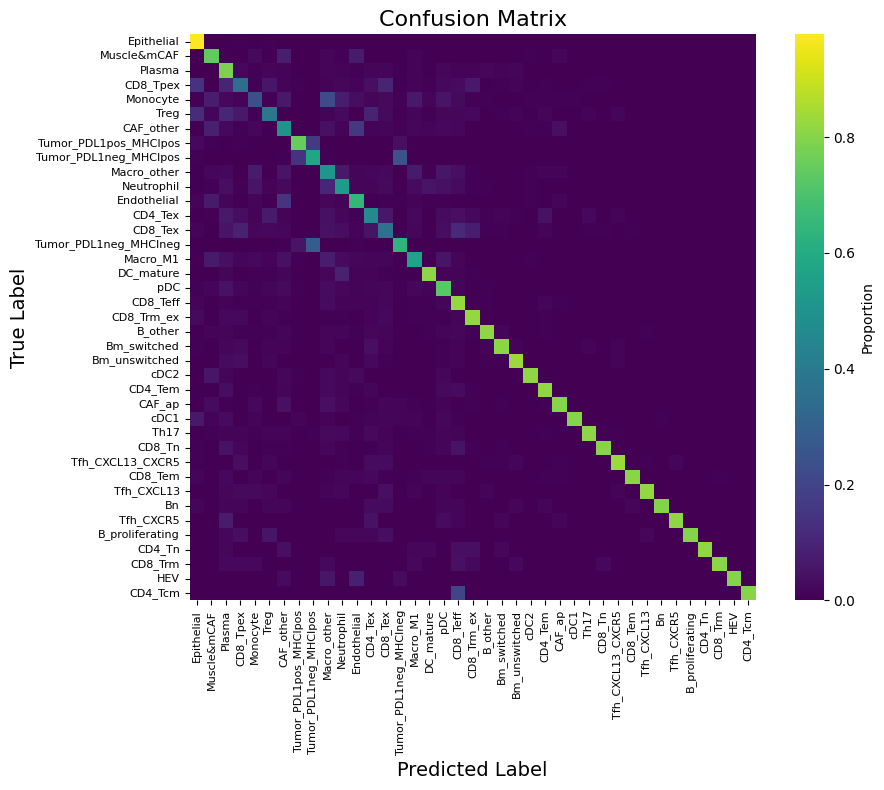


L1 lineage (L2→L1 agg)
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level1.pdf


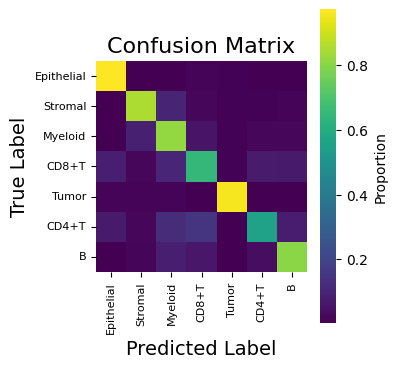


L1 lineage (L1 head)
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level1_L1head.pdf


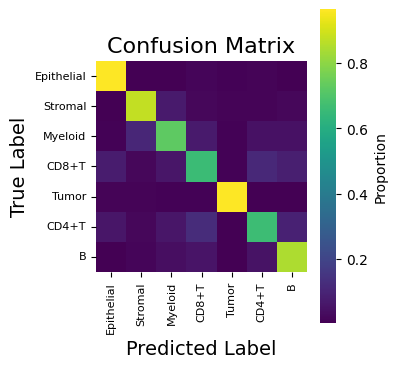


Level12 sublineage
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level12.pdf


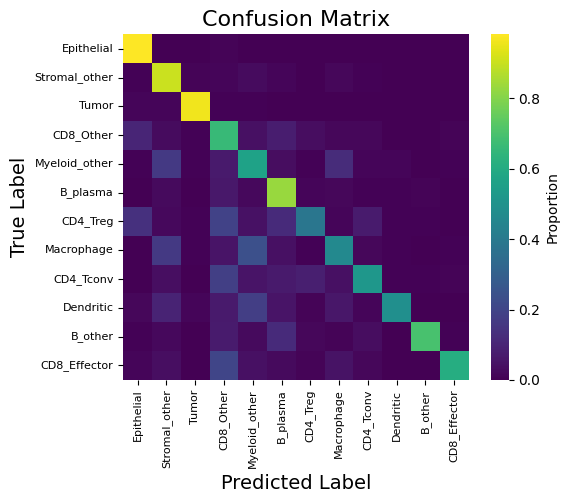


Level0 compartment
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level0.pdf


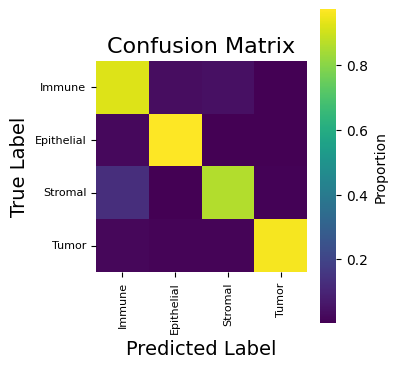


Level01 bucket
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level01.pdf


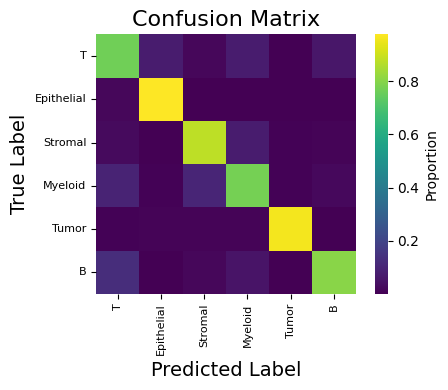

L1 agg vs L1 head agreement: 0.919329531020398


In [10]:
# In-sample confusion matrices for every label tier (best-fold model in LP)
if isinstance(globals().get("LP"), dict) and LP.get("model") is not None:
    ensure_lp_extra_insample_preds(
        LP["model"], scaler, cv_data, device, predict_all_label_heads, globals()
    )
plot_he_confusion_matrices(plot_confusion_matrix, result_fig, cv_data, globals())


In [11]:
# (Legacy duplicate confusion-matrix cell removed; see cell above.)


In [12]:
## Save validation metrics: CV fold means + in-sample per tier
import numpy as np

logo_summary = globals().get("logo_summary")
if logo_summary is None and isinstance(globals().get("LP"), dict):
    logo_summary = LP.get("logo_summary")
if logo_summary is None:
    raise NameError("Run the ablation / CV cell first (globals().update(LP)).")

metrics_csv_path = result_fig("validation_internal_metrics")

hce_w1_used = globals().get("hce_w1", 1.0)
hce_w2_used = globals().get("hce_w2", 1.0)
hce_w12_used = globals().get("hce_w12", 2.0)
hce_w_l12head_used = globals().get("hce_w_l12head", 1.0)
hce_w_l3_used = globals().get("hce_w_l3", 1.0)
hce_w_l4_used = globals().get("hce_w_l4", 1.0)
mean_best_epoch = int(round(float(np.mean([f["best_epoch"] for f in logo_summary["folds"]]))))

insample_tiers, _num_classes = build_insample_tier_metrics(globals(), cv_data if "cv_data" in globals() else None)
tier_extra = collect_hce_tier_metrics_extras(
    logo_summary=logo_summary,
    insample=insample_tiers,
    num_classes=_num_classes,
)

_l2_ins = insample_tiers.get("l2") or {}
_l1_ins = insample_tiers.get("l1") or {}

metrics_df, combined_df = save_hce_validation_metrics(
    val_acc=_l2_ins.get("accuracy", float("nan")),
    val_macro_f1=logo_summary["l2_macro_f1_mean"],
    val_weighted_f1=logo_summary["l2_weighted_f1_mean"],
    val_level1_acc=_l1_ins.get("accuracy", float("nan")),
    val_level1_macro_f1=logo_summary["l1_macro_f1_mean"],
    val_level1_weighted_f1=logo_summary["l1_weighted_f1_mean"],
    class_names=class_names if "class_names" in globals() else None,
    class_names_level1=class_names_level1 if "class_names_level1" in globals() else None,
    best_epoch=mean_best_epoch,
    hce_w1=hce_w1_used,
    hce_w2=hce_w2_used,
    hce_w12=hce_w12_used,
    hce_w_l12head=hce_w_l12head_used,
    hce_w_l3=hce_w_l3_used,
    hce_w_l4=hce_w_l4_used,
    therapy_data=f"{therapy_data}_kfold_CV",
    metrics_csv_path=metrics_csv_path,
    extra_metrics=tier_extra,
)

print("\nPer-tier columns in CSV (cv_* = fold mean, insample_* = all cells, best-fold model):")
_tier_cols = [c for c in combined_df.columns if c.startswith(("cv_", "insample_", "num_"))]
print(combined_df[_tier_cols].tail(1).T)


Current run metrics:
             timestamp   therapy_data  best_epoch hce_lambda  hce_w1  hce_w2  \
0  2026-06-12 12:25:53  NCRT_kfold_CV           0       None     1.0     2.0   

   hce_w12  hce_w_l12head  hce_w_l3  hce_w_l4  ...  insample_l3_accuracy  \
0      1.0            1.0       1.0       1.0  ...              0.924871   

   insample_l3_macro_f1  insample_l3_weighted_f1  insample_l4_accuracy  \
0              0.925666                 0.924675              0.857002   

   insample_l4_macro_f1  insample_l4_weighted_f1  num_l1_head_classes  \
0              0.857366                 0.855742                    7   

   num_l12_classes  num_l3_classes  num_l4_classes  
0               12               4               6  

[1 rows x 76 columns]

Saved comparison table to: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/validation_internal_metrics.csv
Total rows: 5

Per-tier columns in CSV (cv_* = fold mean, insample_* = all cells, best-fold mod

Visualizing per-class performance...
  ✓ Computed metrics for 39 classes


Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_perclass_level2.pdf


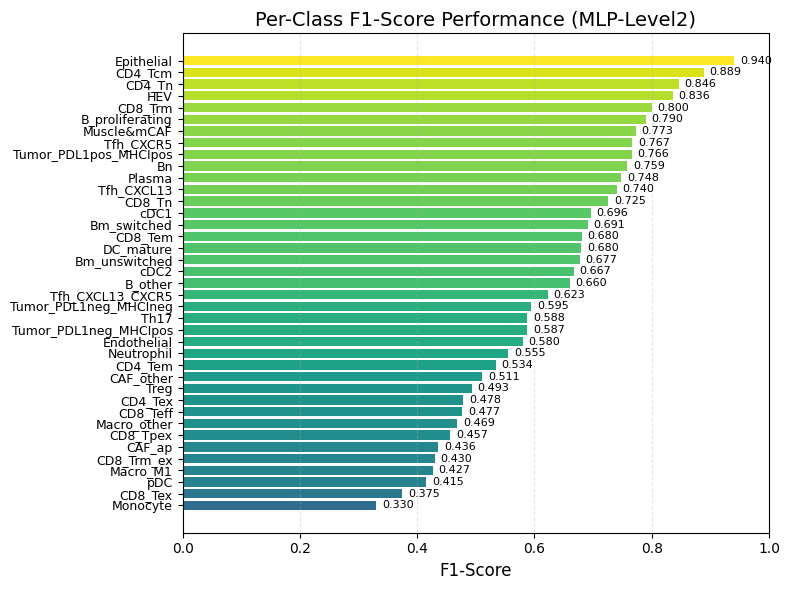


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 39
  Actual classes in test set: 39
  Feature dimension: 1024
  Model parameters: 1,726,788
  Best epoch: 0
  Test Accuracy: 0.6534
  Test Macro F1: 0.6280
  Test Weighted F1: 0.6462
Visualizing per-class performance...
  ✓ Computed metrics for 7 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_perclass_level1.pdf


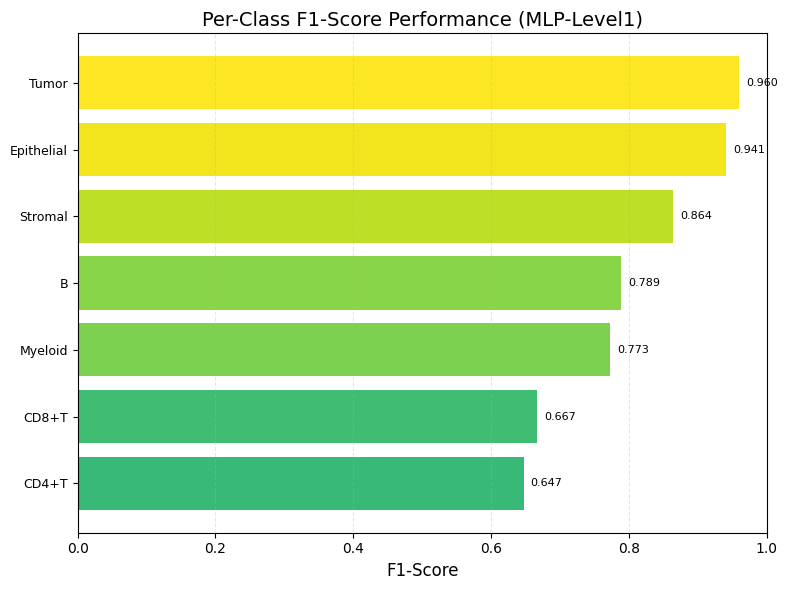


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 7
  Actual classes in test set: 7
  Feature dimension: 1024
  Model parameters: 1,726,788
  Best epoch: 0
  Test Accuracy: 0.8258
  Test Macro F1: 0.8060
  Test Weighted F1: 0.8228
Visualizing per-class performance...
  ✓ Computed metrics for 7 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_perclass_level1_L1head.pdf


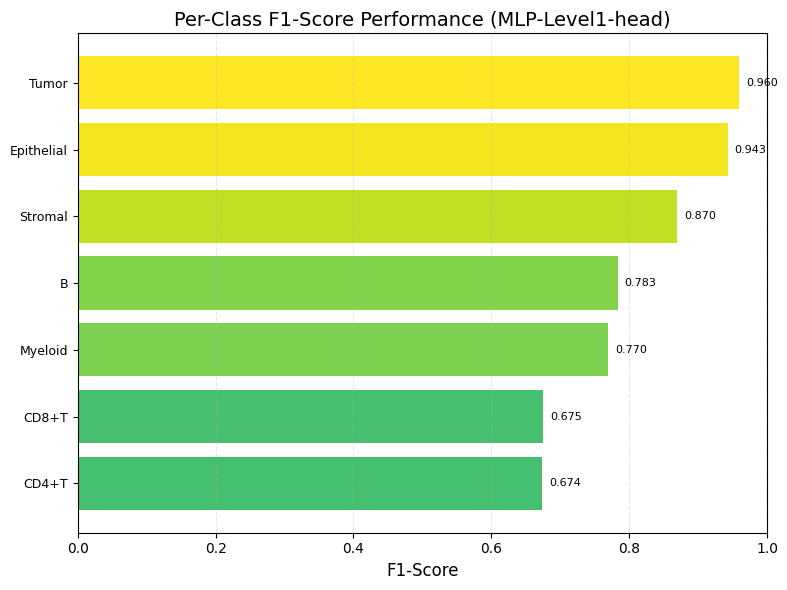


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 7
  Actual classes in test set: 7
  Feature dimension: 1024
  Model parameters: 1,726,788
  Best epoch: 0
  Test Accuracy: 0.8258
  Test Macro F1: 0.8060
  Test Weighted F1: 0.8228

Level12 sublineage
Visualizing per-class performance...
  ✓ Computed metrics for 12 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_perclass_level12.pdf


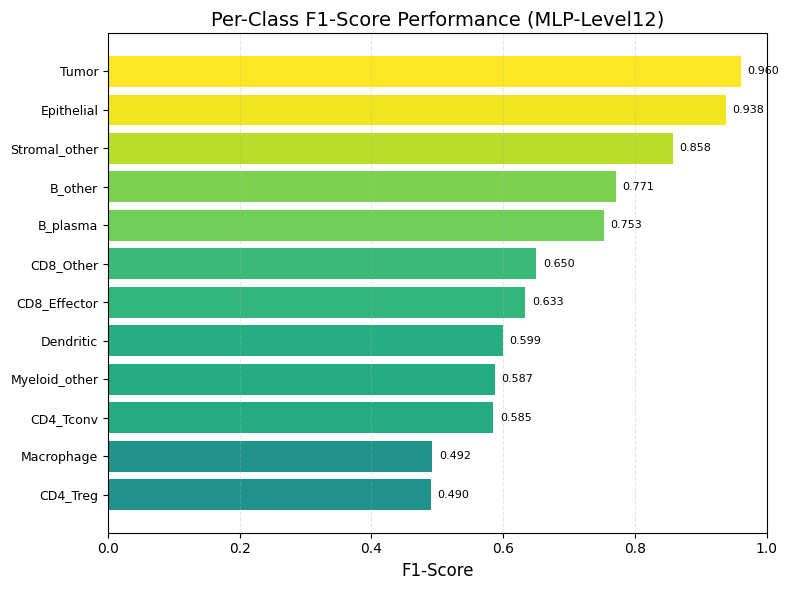


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 12
  Actual classes in test set: 12
  Feature dimension: 1024
  Model parameters: 1,726,788
  Best epoch: 0
  Test Accuracy: 0.7752
  Test Macro F1: 0.6932
  Test Weighted F1: 0.7665

Level0 compartment
Visualizing per-class performance...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_perclass_level0.pdf


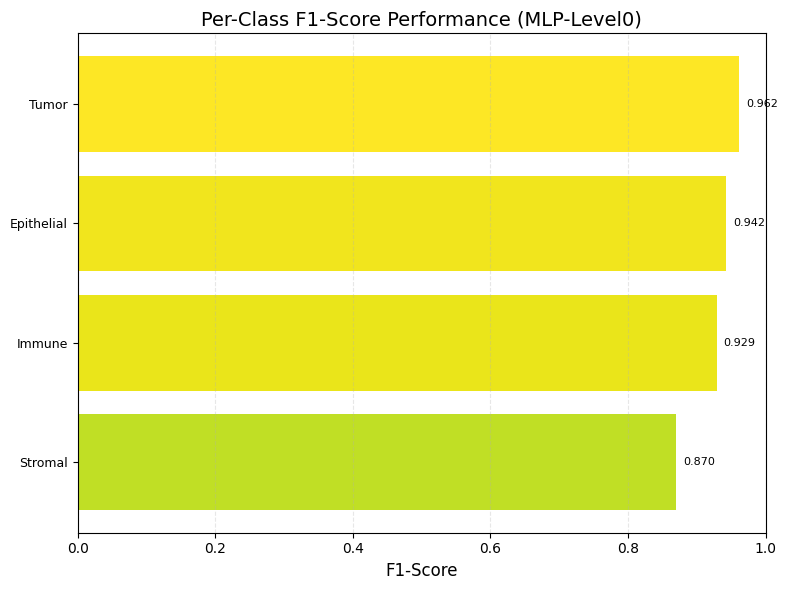


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Feature dimension: 1024
  Model parameters: 1,726,788
  Best epoch: 0
  Test Accuracy: 0.9249
  Test Macro F1: 0.9257
  Test Weighted F1: 0.9247

Level01 bucket
Visualizing per-class performance...
  ✓ Computed metrics for 6 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_perclass_level01.pdf


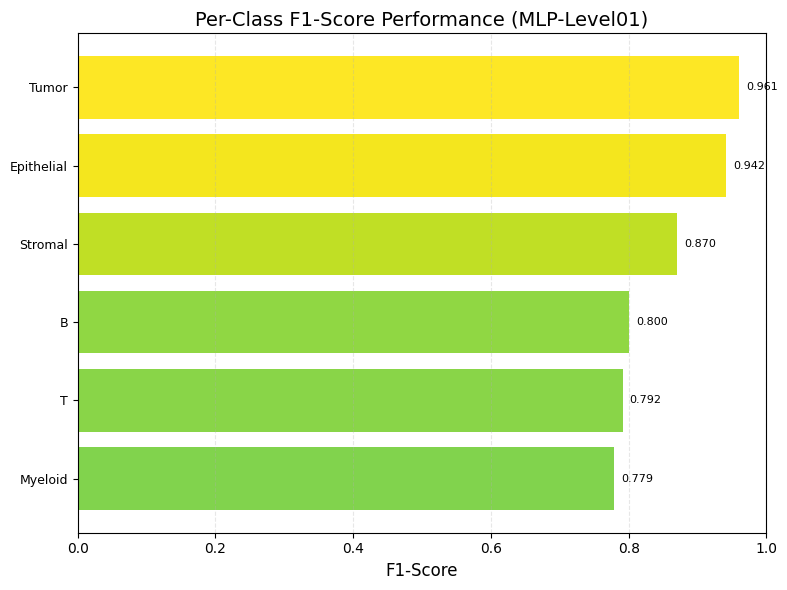


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 6
  Actual classes in test set: 6
  Feature dimension: 1024
  Model parameters: 1,726,788
  Best epoch: 0
  Test Accuracy: 0.8570
  Test Macro F1: 0.8574
  Test Weighted F1: 0.8557


In [13]:
# Per-class F1 for level2 / level1 / extra tiers
metrics_df_level2 = plot_per_class_f1(
    val_labels, val_preds, class_names,
    model=model, device=device,
    train_dataset=train_dataset, val_dataset=val_dataset,
    input_dim=input_dim, best_epoch=best_epoch,
    test_acc=val_acc, test_macro_f1=val_macro_f1, test_weighted_f1=val_weighted_f1,
    model_name="MLP-Level2", y_sort_by="f1_asc",
    save_path=result_fig("f1_perclass_level2"),
)

metrics_df_level1 = plot_per_class_f1(
    val_labels_level1, val_preds_level1, class_names_level1,
    model=model, device=device,
    train_dataset=train_dataset, val_dataset=val_dataset,
    input_dim=input_dim, best_epoch=best_epoch,
    test_acc=val_level1_acc, test_macro_f1=val_level1_macro_f1, test_weighted_f1=val_level1_weighted_f1,
    model_name="MLP-Level1", y_sort_by="f1_asc",
    save_path=result_fig("f1_perclass_level1"),
)

if globals().get("val_preds_level1_head") is not None:
    plot_per_class_f1(
        val_labels_level1, val_preds_level1_head, class_names_level1,
        model=model, device=device,
        train_dataset=train_dataset, val_dataset=val_dataset,
        input_dim=input_dim, best_epoch=best_epoch,
        test_acc=val_level1_acc, test_macro_f1=val_level1_macro_f1, test_weighted_f1=val_level1_weighted_f1,
        model_name="MLP-Level1-head", y_sort_by="f1_asc",
        save_path=result_fig("f1_perclass_level1_L1head"),
    )

if isinstance(globals().get("LP"), dict) and LP.get("model") is not None:
    ensure_lp_extra_insample_preds(
        LP["model"], scaler, cv_data, device, predict_all_label_heads, globals()
    )
plot_he_f1_extra_tiers(
    plot_per_class_f1, result_fig, model, device,
    train_dataset, val_dataset, input_dim, best_epoch, globals(),
)


  Using provided X and y...
  X_all_scaled shape: (80302, 1024)
  y_all_encoded shape: (80302,)
  ✓ Final y_all_encoded dtype: int64
X_all_scaled:  (80302, 1024)
y_all_encoded:  (80302,)
  ⚠ Large dataset detected (80302 samples). Setting num_workers=0 to avoid indexing issues.
  Total samples: 80302
  DataLoader batch_size: 1024, num_workers: 0

Final Performance on All Data:
  Accuracy: 0.6533
  Macro F1-score: 0.6279
  Weighted F1-score: 0.6461
all_preds:  (80302,)
unique_labels:  (39,)

Detailed Classification Report:
  Number of classes: 39
                       precision    recall  f1-score   support

              B_other       0.56      0.81      0.66       426
      B_proliferating       0.78      0.80      0.79        59
          Bm_switched       0.60      0.81      0.69       376
        Bm_unswitched       0.57      0.83      0.68       354
                   Bn       0.72      0.80      0.76        69
               CAF_ap       0.30      0.80      0.44       223
      

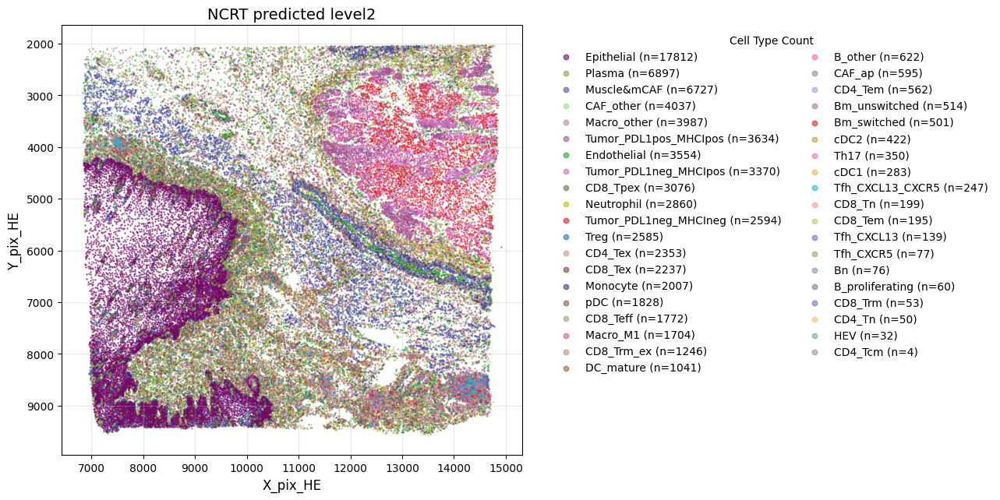


Plotting spatial distribution of TRUE level2 cell types...
Number of valid data points: 80302
Number of cell types: 39


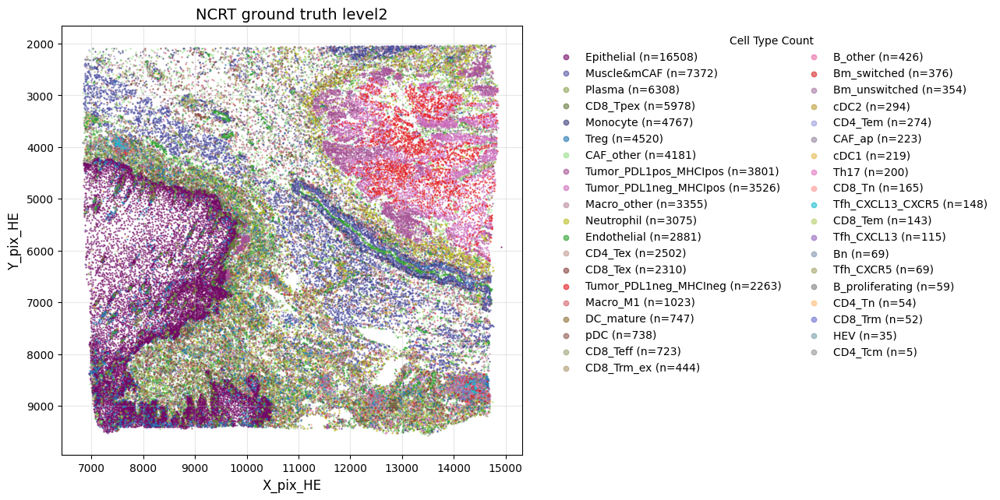

In [14]:
## Evaluate on all data: level2 spatial — predicted vs ground truth
all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model,
    matched_features_path="",
    class_names=class_names,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=val_loader if "val_loader" in globals() else None,
    X=cv_data["X_f"],
    y=cv_data["y_f"],
    y_encoded=cv_data["y_encoded_f"],
    X_coords_matched=X_coords_plot if "X_coords_plot" in globals() else None,
    celltype_pred_dir=result_fig("celltype_valid_level2"),
    celltype_true_dir=result_fig("celltype_true_level2"),
    spatial_plot_mode="pred_true_l2",
    spatial_color_scheme="ncrt",
    spatial_title_pred_l2=f"{therapy_data} predicted level2",
    spatial_title_true_l2=f"{therapy_data} ground truth level2",
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_tumor1 if "celltype_pixel_NCRT_tumor1" in globals() else None,
)


  Level1 spatial plot: NCRT distinct palette for 7 class name(s).
Number of valid data points: 80302
Number of cell types: 7


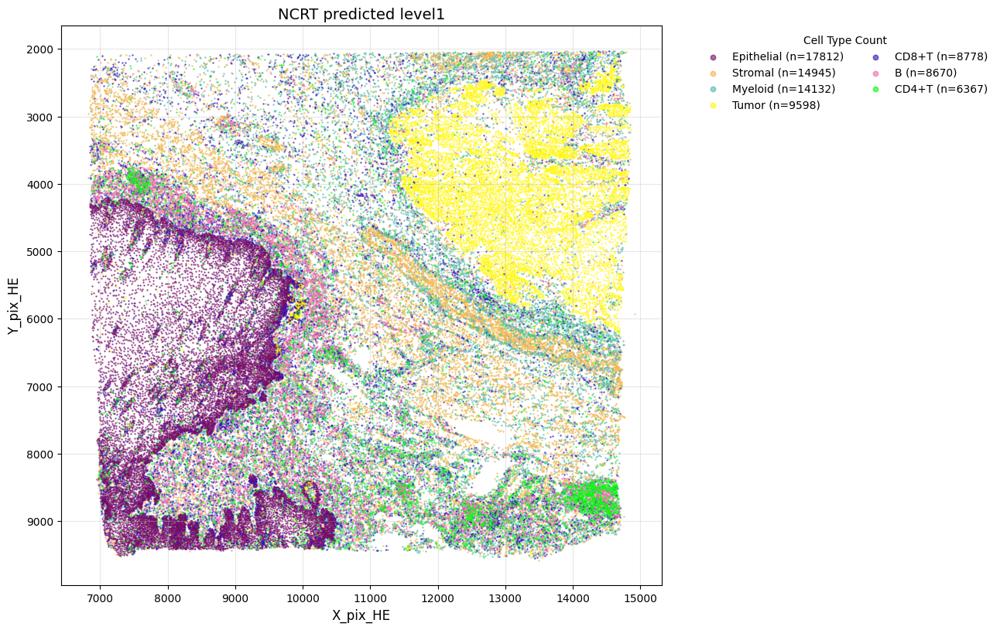

  Saved level1 predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_valid_level1.jpg
Number of valid data points: 80302
Number of cell types: 7


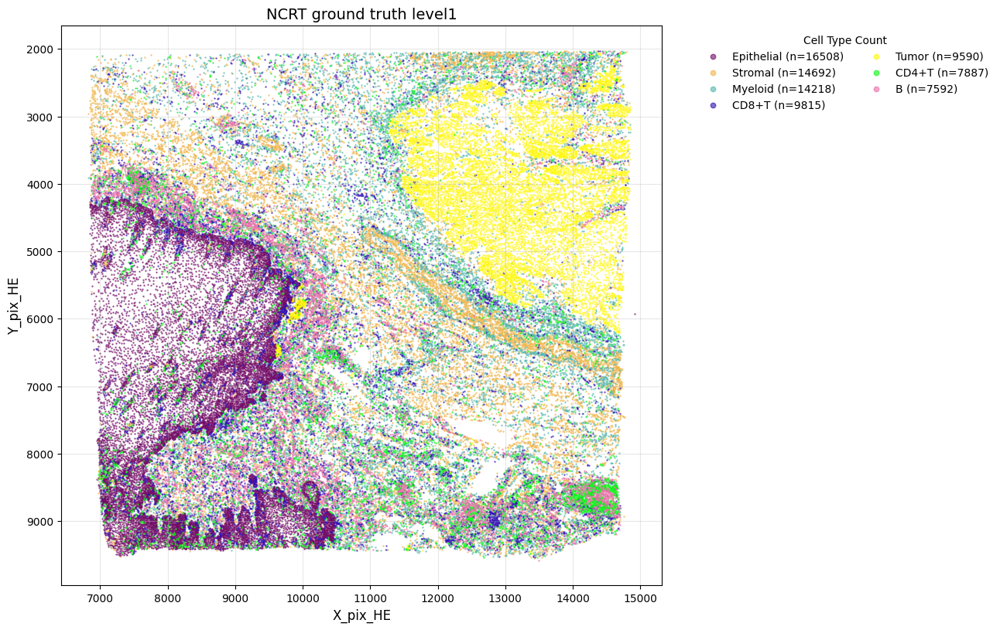

  Saved level1 true spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_true_level1.jpg


In [15]:
## HE level1 spatial — predicted vs ground truth
plot_level1_spatial_distribution(
    matched_features_path=matched_features_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=result_fig("celltype_valid_level1"),
    save_path_true=result_fig("celltype_true_level1"),
    spatial_color_scheme="ncrt",
    title_pred=f"{therapy_data} predicted level1",
    title_true=f"{therapy_data} ground truth level1",
    X_coords_matched=X_coords_plot if "X_coords_plot" in globals() else None,
    y_level1_f=y_level1_f if "y_level1_f" in globals() else None,
)



Level12 sublineage
Number of valid data points: 80302
Number of cell types: 12


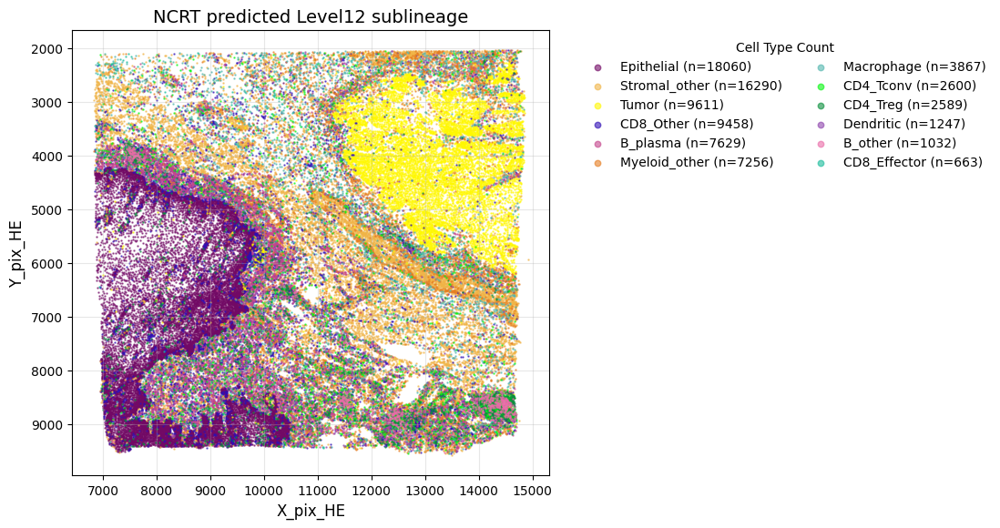

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_valid_level12.jpg
Number of valid data points: 80302
Number of cell types: 12


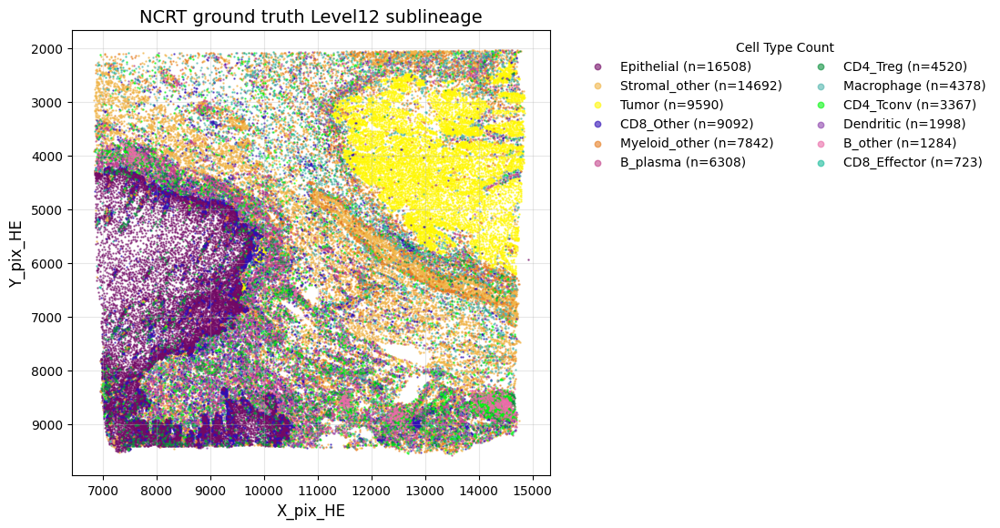

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_true_level12.jpg

Level0 compartment
Number of valid data points: 80302
Number of cell types: 4


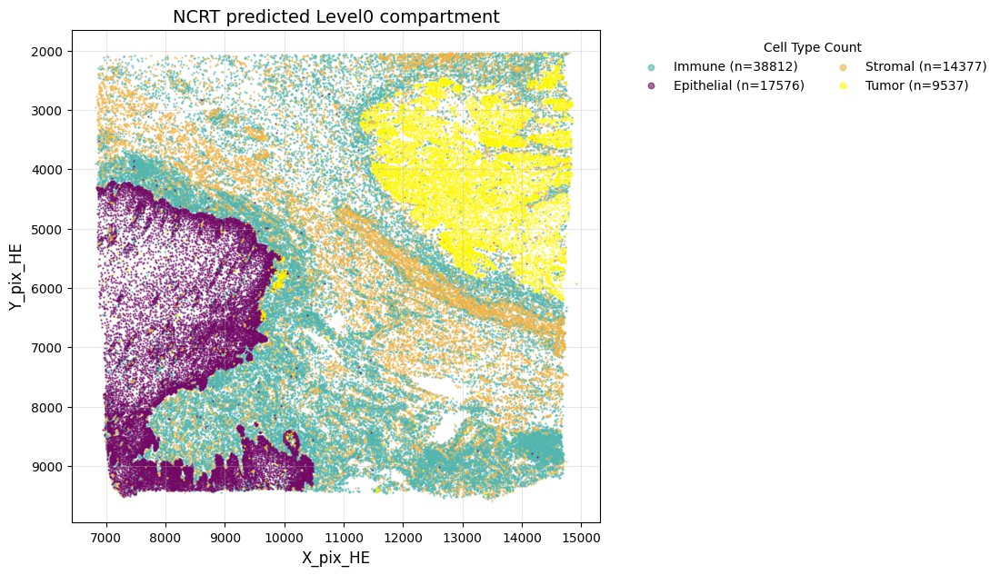

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_valid_level0.jpg
Number of valid data points: 80302
Number of cell types: 4


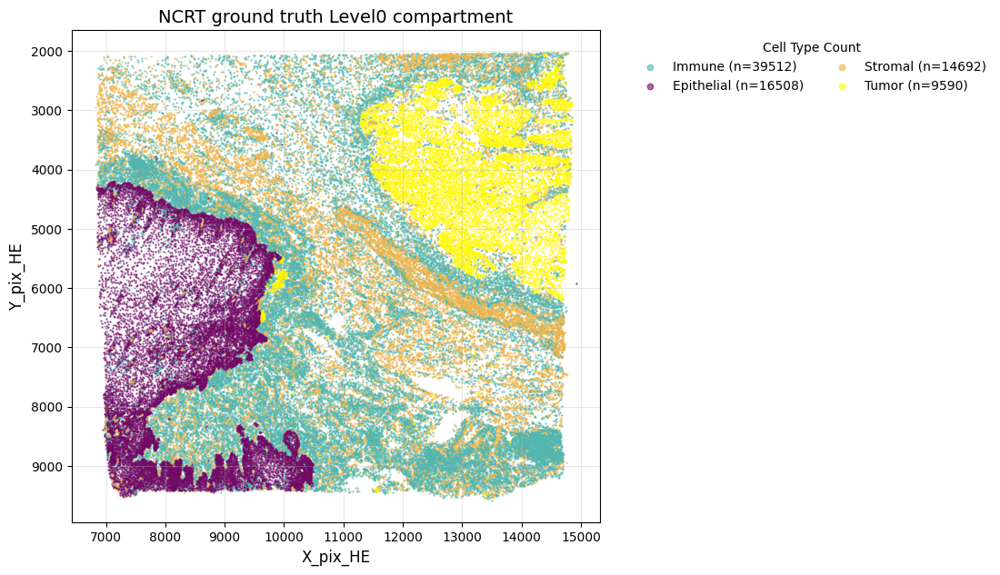

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_true_level0.jpg

Level01 bucket
Number of valid data points: 80302
Number of cell types: 6


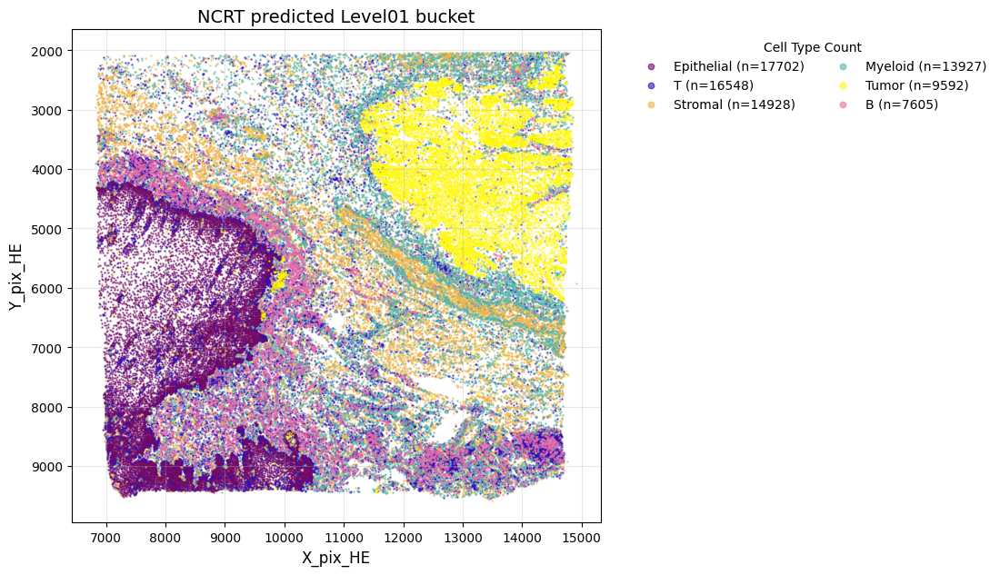

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_valid_level01.jpg
Number of valid data points: 80302
Number of cell types: 6


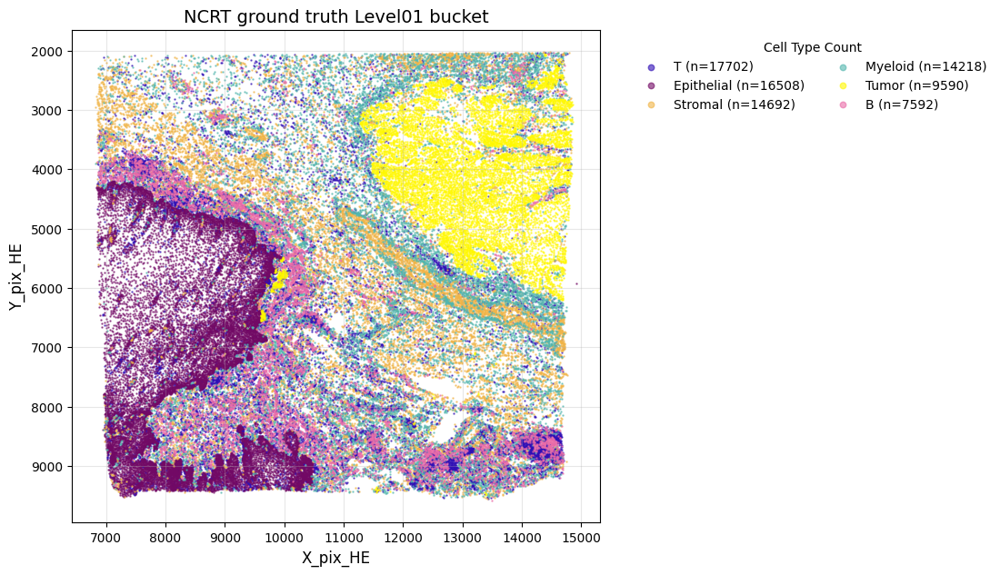

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_true_level01.jpg


In [16]:
## HE Level12 / Level0 / Level01 spatial — predicted vs ground truth
if isinstance(globals().get("LP"), dict) and LP.get("model") is not None:
    ensure_lp_extra_insample_preds(
        LP["model"], scaler, cv_data, device, predict_all_label_heads, globals()
    )
plot_he_spatial_extra_tiers(
    plot_tier_spatial_distribution,
    plot_celltype_spatial_distribution,
    result_fig,
    therapy_data,
    X_coords_plot if "X_coords_plot" in globals() else None,
    cv_data if "cv_data" in globals() else None,
    globals(),
)



Level12 sublineage
Visualizing per-class performance...
  ✓ Computed metrics for 12 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_perclass_level12.pdf


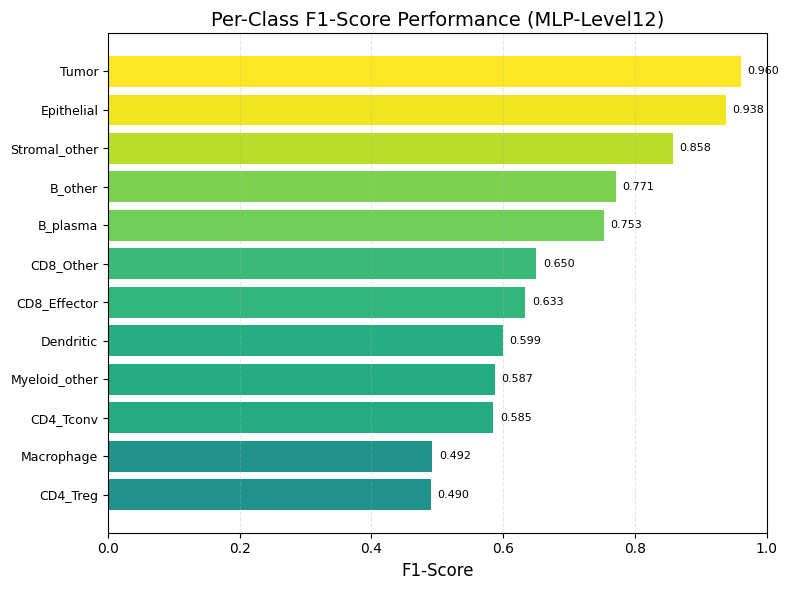


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 12
  Actual classes in test set: 12
  Feature dimension: 1024
  Model parameters: 1,726,788
  Best epoch: 0
  Test Accuracy: 0.7752
  Test Macro F1: 0.6932
  Test Weighted F1: 0.7665

Level0 compartment
Visualizing per-class performance...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_perclass_level0.pdf


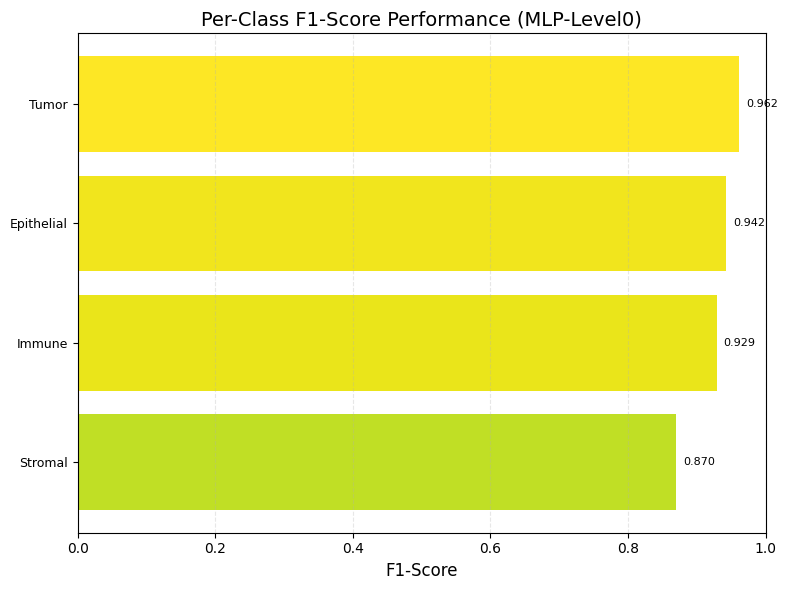


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Feature dimension: 1024
  Model parameters: 1,726,788
  Best epoch: 0
  Test Accuracy: 0.9249
  Test Macro F1: 0.9257
  Test Weighted F1: 0.9247

Level01 bucket
Visualizing per-class performance...
  ✓ Computed metrics for 6 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_perclass_level01.pdf


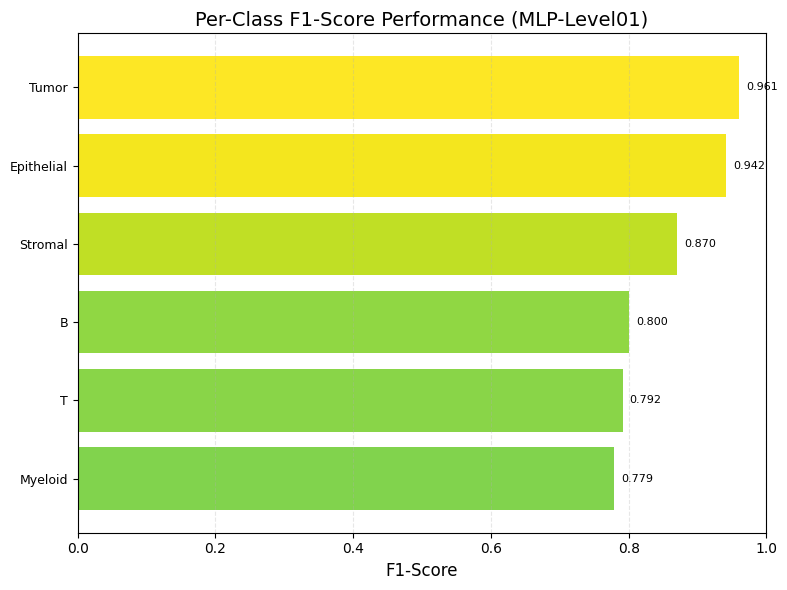


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 6
  Actual classes in test set: 6
  Feature dimension: 1024
  Model parameters: 1,726,788
  Best epoch: 0
  Test Accuracy: 0.8570
  Test Macro F1: 0.8574
  Test Weighted F1: 0.8557


In [17]:
## HE per-class F1 — Level12 / Level0 / Level01
if isinstance(globals().get("LP"), dict) and LP.get("model") is not None:
    ensure_lp_extra_insample_preds(
        LP["model"], scaler, cv_data, device, predict_all_label_heads, globals()
    )
plot_he_f1_extra_tiers(
    plot_per_class_f1, result_fig, model, device,
    train_dataset, val_dataset, input_dim, best_epoch, globals(),
)


## Predict StarDist


In [18]:
## Load best model for StarDist prediction
model_star = load_model_for_predict(path, therapy_data, therapy_model, parent_dir=True)


Loading best model for StarDist prediction...
  Checkpoint file: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/best_mlp_gpu.pt
  Inferred hidden_dims from checkpoint: [1024, 512, 256]
✓ StarDist model loaded


In [19]:
## Tumor1 StarDist — match embeddings with celltype CSV
celltype_pixel_NCRT_stardist_path = f'{path}Hist2Pheno/data/CODEX/ESCC/{transfer_data}/{therapy_data}_CellPixCoords_tumor1_StarDist.csv'
embedding_star_dir = Path(f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/ImgEmbeddings_tumor1_stardist/sc_pth_16_16")
matched_features_star_path = f"{path}Hist2Pheno/data/CODEX/ESCC/{therapy_data}/{therapy_model}/matched_features_tumor1_stardist012.npz"

level1_name = globals().get("level1_name", "celltype_level1")
match_tolerance = 1.0
X_star, y_star, y_star_level1, y_star_level3, y_star_level4, y_star_level12, X_coords_star = match_hist2cell_matrix(
    cell_coords_path=celltype_pixel_NCRT_stardist_path,
    hist_embedding_dir=embedding_star_dir,
    matched_features_path=matched_features_star_path,
    coord_cols=("centroid_x", "centroid_y"),
    tolerance=match_tolerance,
    pth_prefix=f"sc_{therapy_data}",
    level1_name=level1_name,
    rebuild_if_missing_hierarchy=True,
)

alias_ncrt_hierarchy_labels(globals(), cv_data if "cv_data" in globals() else None)
ensure_stardist_hierarchy_labels(globals(), cv_data if "cv_data" in globals() else None)


Loading celltype Ground Truth ...
  Loaded 77996 cells
  Cell types: 40 unique types

Loading HIPT embeddings (full scan: 77,996 .pth files, cap=400,000; skipping selective path probe).
  Loading embeddings...


Loading .pth files (workers=16): 100%|██████████| 77996/77996 [01:17<00:00, 1008.36it/s]


  Successfully loaded 77996 embeddings
  Embedding dimension: (1024,)

Matching embeddings with celltype data (this may take a few minutes)...
  Using specified coordinates: centroid_x, centroid_y
  Building KDTree for embeddings: 77,996 points
  KDTree matched 77,996 / 77,996 cells (100.00%).
  Matched 77996 cells out of 77996
  Match rate: 100.00%

Saving matched data for future use...
  ✓ Saving y_level3 from column 'celltype_level0'
  ✓ Saving y_level4 from column 'celltype_level01'
  ✓ Saving y_level12 from column 'celltype_level12'
  ✓ Saved features to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/matched_features_tumor1_stardist012.npz
  ✓ Saved coordinates for spatial visualization

Data shape:
  X alignment: 77996 rows
  y (L2 / celltype): (77996,), 40 classes
  y_level1 (lineage): (77996,), 7 classes
  y_level12 (sublineage): (77996,), 12 classes
  y_level3 (CNiche): (77996,), 4 classes
  y_level4 (TNiche): (77996,), 6 classes
  Matched row ke

  Loading data from matched_features_path...
  ✓ Loaded X from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/matched_features_tumor1_stardist012.npz: (77996, 1024)
  ✓ Loaded y from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/matched_features_tumor1_stardist012.npz: (77996,), dtype: <U21
  ⚠ prediction_only=True: Labels will be used for visualization only, not for evaluation.
  ✓ Keeping labels as strings for visualization (no encoding needed)
  ✓ Scaled X using provided scaler
  X_all_scaled shape: (77996, 1024)
  No labels available - prediction mode only
X_all_scaled:  (77996, 1024)
dummy_labels:  (77996,)
  ⚠ Large dataset detected (77996 samples). Setting num_workers=0 to avoid indexing issues.
  Total samples: 77996
  DataLoader batch_size: 1024, num_workers: 0
  Predicting on new data (no labels for evaluation)...


Predicting: 100%|██████████| 77/77 [00:00<00:00, 143.35it/s]



Prediction completed:
  Total predictions: 77996
  Predicted classes: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38]
  ✓ Using original labels for visualization: 77996 labels
  ⚠ 1 true labels are not in class_names; excluding them from metric computation.
  ✓ Computed metrics in prediction_only mode from aligned true labels: acc=0.4425, macro_f1=0.2362, weighted_f1=0.4358

Preparing spatial distribution plot...
  Matching predictions with coordinates...
  ✓ Loaded coordinates from /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/matched_features_tumor1_stardist012.npz: (77996, 2)
  Coordinates shape: (77996, 2)
  Predictions shape: (77996,)
  ✓ Created prediction DataFrame with 77996 cells

Plotting spatial distribution of PREDICTED level2 cell types...
Number of valid data points: 77996
Number of cell types: 39


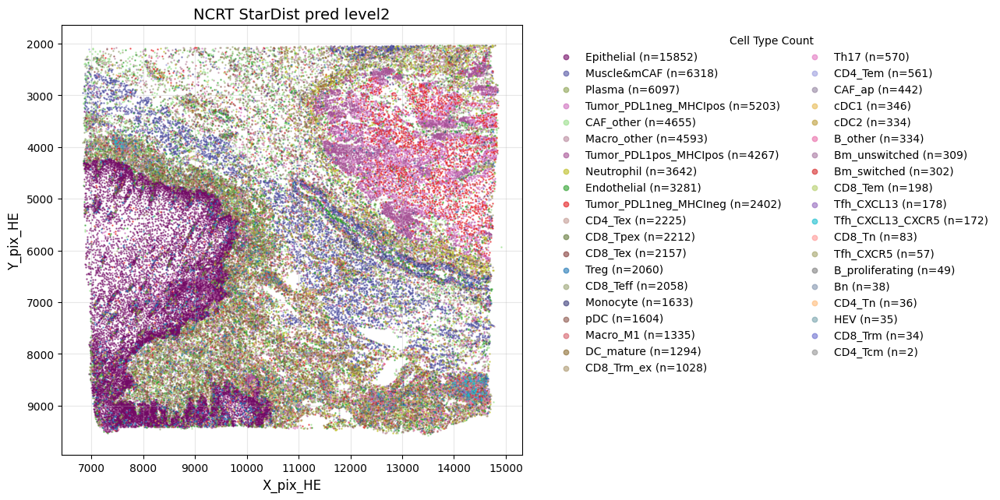


Plotting spatial distribution of TRUE level2 cell types...
Number of valid data points: 77996
Number of cell types: 40


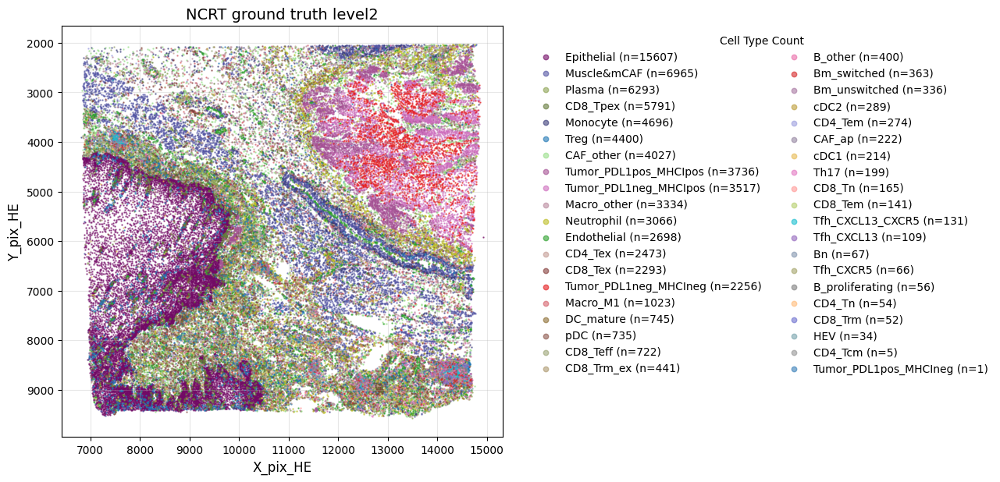

In [20]:
## StarDist evaluate + level2 spatial
_sn = globals().get("class_names_star")
class_names_star = class_names if _sn is None else _sn

all_acc, all_macro_f1, all_weighted_f1, all_preds, all_labels = evaluate_and_plot_on_all_data(
    model=model_star,
    matched_features_path=matched_features_star_path,
    class_names=class_names_star,
    evaluate=evaluate,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    CellTypeDataset=CellTypeDataset,
    device=device,
    scaler=scaler,
    val_loader=None,
    prediction_only=True,
    X=X_star if "X_star" in globals() else None,
    y=y_star if "y_star" in globals() else None,
    X_coords_matched=X_coords_star if "X_coords_star" in globals() else None,
    celltype_pred_dir=result_fig("stardist_pred_level2"),
    celltype_true_dir=result_fig("stardist_true_level2"),
    spatial_plot_mode="pred_true_l2",
    spatial_color_scheme="ncrt",
    spatial_title_pred_l2=f"{therapy_data} StarDist pred level2",
    spatial_title_true_l2=f"{therapy_data} ground truth level2",
    celltype_pixel_NCRT_tumor1=celltype_pixel_NCRT_stardist if "celltype_pixel_NCRT_stardist" in globals() else None,
)


  Level1 spatial plot: NCRT distinct palette for 7 class name(s).
Number of valid data points: 77996
Number of cell types: 7


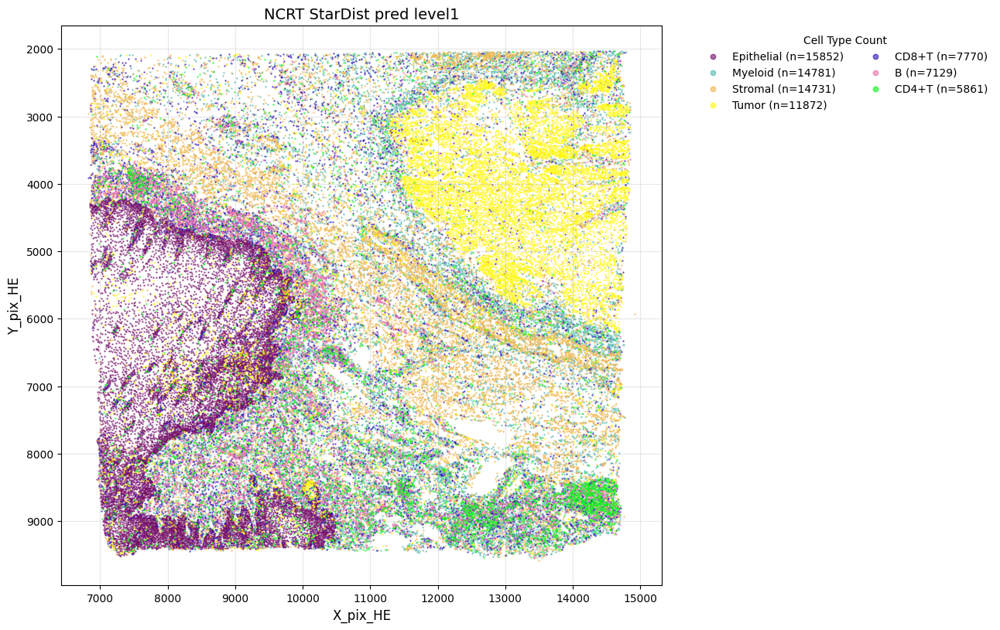

  Saved level1 predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_pred_stardist_level1.jpg
Number of valid data points: 77996
Number of cell types: 7


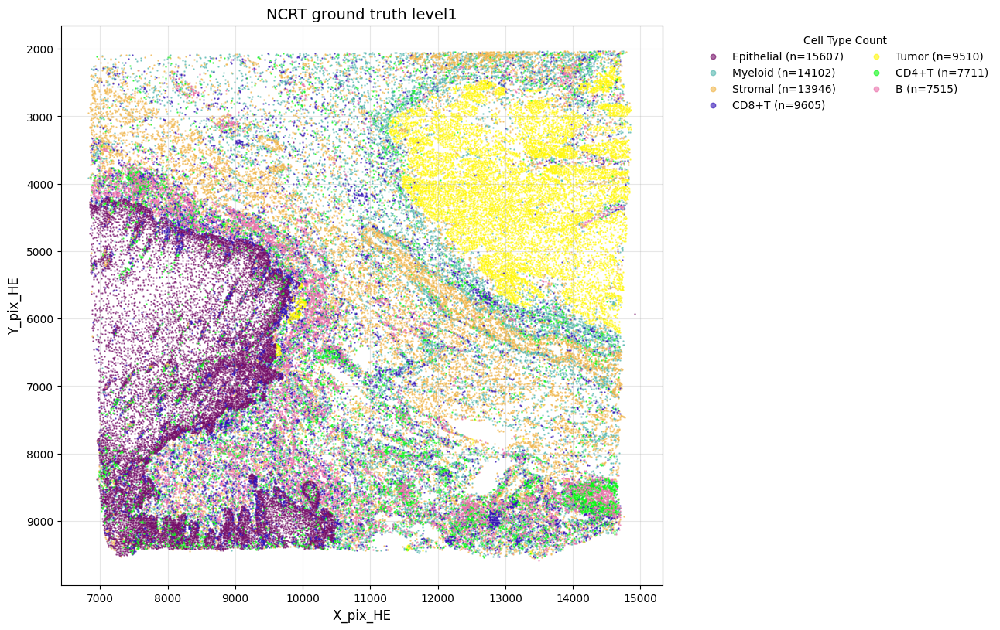

  Saved level1 true spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_true_stardist_level1.jpg
  Ground-truth tier check (Level12 sublineage): ['B_other', 'B_plasma', 'CD4_Tconv', 'CD4_Treg', 'CD8_Effector', 'CD8_Other', 'Dendritic', 'Epithelial', 'Macrophage', 'Myeloid_other', 'Stromal_other', 'Tumor']

Level12 sublineage (StarDist)
Number of valid data points: 77996
Number of cell types: 12


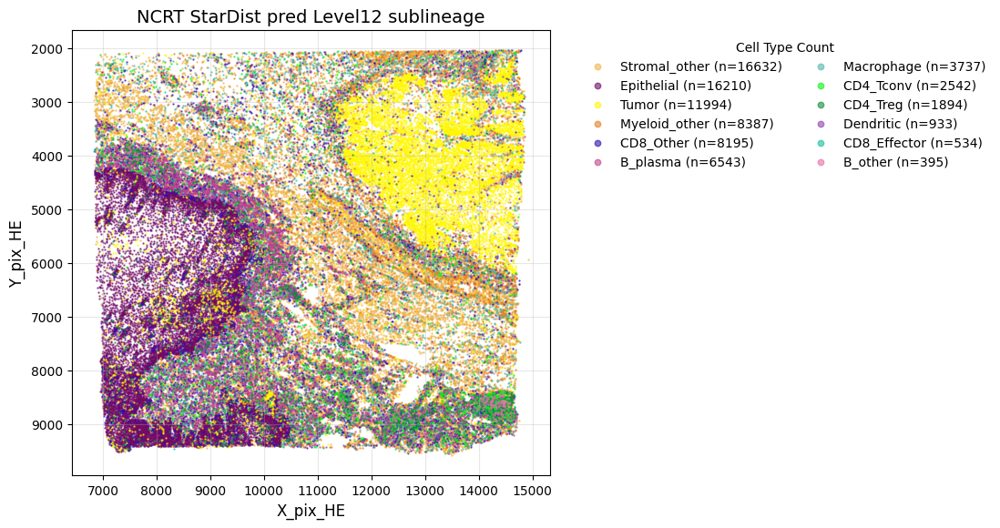

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_pred_stardist_level12.jpg
Number of valid data points: 77996
Number of cell types: 12


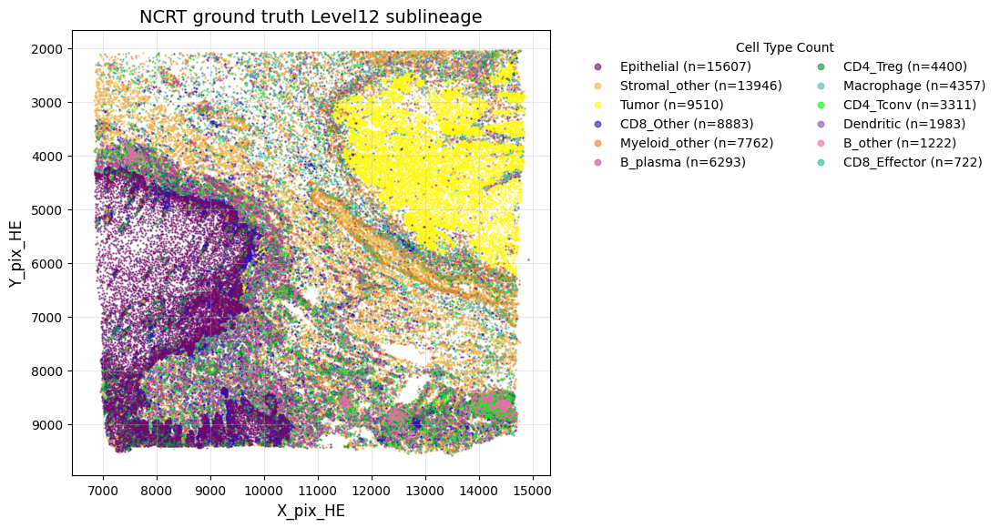

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_true_stardist_level12.jpg
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_pred_stardist_level12.jpg
  Ground-truth tier check (Level0 compartment): ['Epithelial', 'Immune', 'Stromal', 'Tumor']

Level0 compartment (StarDist)
Number of valid data points: 77996
Number of cell types: 4


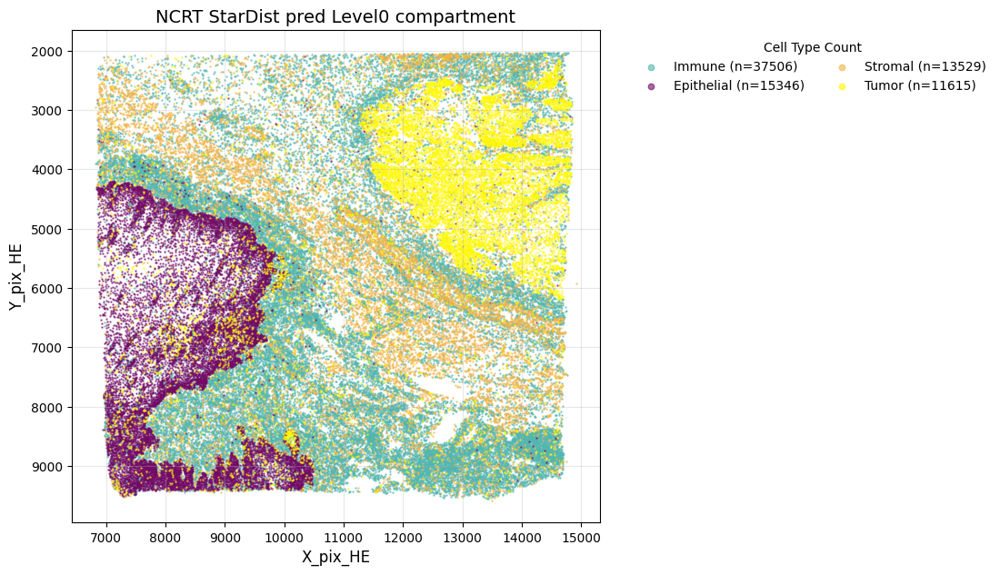

  Saved predicted spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_pred_stardist_level0.jpg
Number of valid data points: 77996
Number of cell types: 4


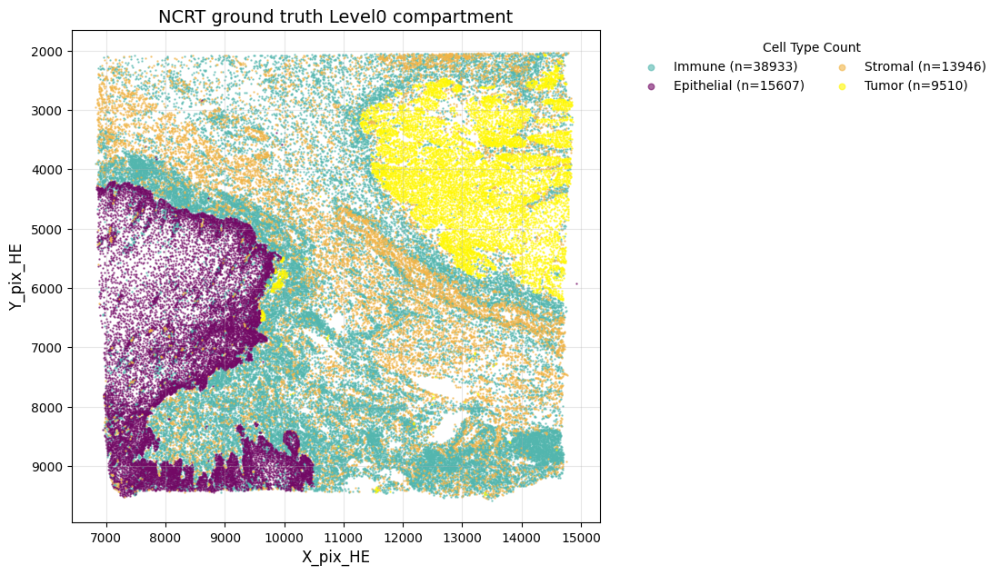

  Saved ground-truth spatial plot: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_true_stardist_level0.jpg
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/celltype_pred_stardist_level0.jpg
  ⚠ y_star_level4 looks like Level01 labels ['B', 'Epithelial', 'Myeloid', 'Stromal', 'T', 'Tumor']; re-run ensure_stardist_hierarchy_labels() before plotting.


In [21]:
## StarDist level1 spatial + Level12 / Level0 / Level01 spatial
ensure_stardist_hierarchy_labels(globals(), cv_data if "cv_data" in globals() else None)

plot_level1_spatial_distribution(
    matched_features_path=matched_features_star_path,
    all_preds=all_preds,
    class_names_level1=class_names_level1,
    class_names=class_names_star,
    y_encoded_f=y_encoded_f,
    y_level1_encoded_f=y_level1_encoded_f,
    plot_celltype_spatial_distribution=plot_celltype_spatial_distribution,
    save_path_pred=result_fig("stardist_pred_level1"),
    save_path_true=result_fig("stardist_true_level1"),
    spatial_color_scheme="ncrt",
    title_pred=f"{therapy_data} StarDist pred level1",
    title_true=f"{therapy_data} ground truth level1",
    X_coords_matched=X_coords_star if "X_coords_star" in globals() else None,
    y_level1_f=y_star_level1,
)

if not hasattr(model_star, "level12_head"):
    print("Skip StarDist Level12/Level0/Level01 spatial: model_star is not five-head.")
else:
    _star_heads = stardist_head_preds(model_star, scaler, X_star, device, predict_all_label_heads)
    plot_stardist_spatial_extra(
        plot_tier_spatial_distribution,
        plot_celltype_spatial_distribution,
        result_fig,
        therapy_data,
        X_coords_star,
        _star_heads,
        cv_data if "cv_data" in globals() else None,
        globals(),
    )



Visualizing per-class accuracy...
  ✓ Computed metrics for 40 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/acc_level2_stardist.pdf


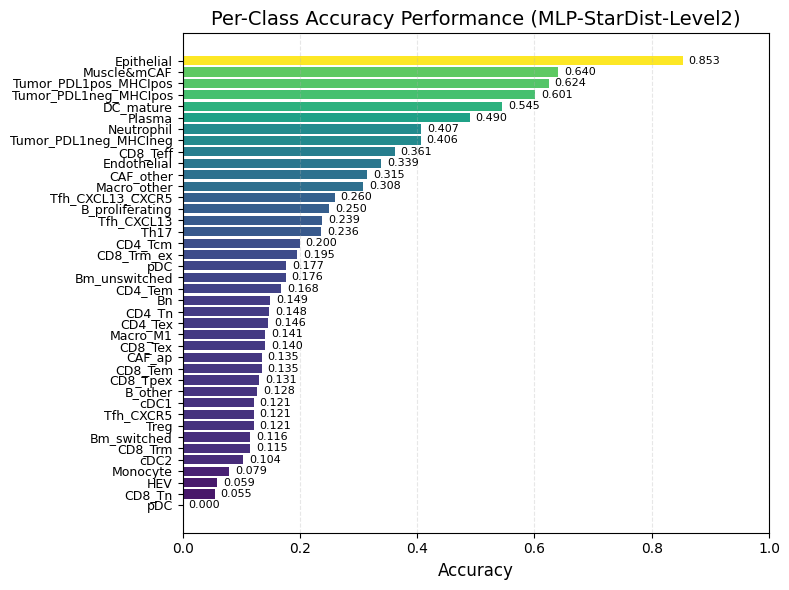


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 39
  Actual classes in test set: 40
  Model parameters: 1,726,788
  Test Accuracy: 0.4425
  Test Macro F1: 0.2362
  Test Weighted F1: 0.4358
  Level1 metrics from level2 preds: acc=0.5898, macro_f1=0.5487, weighted_f1=0.5798
Visualizing per-class accuracy...
  ✓ Computed metrics for 7 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/acc_level1_stardist.pdf


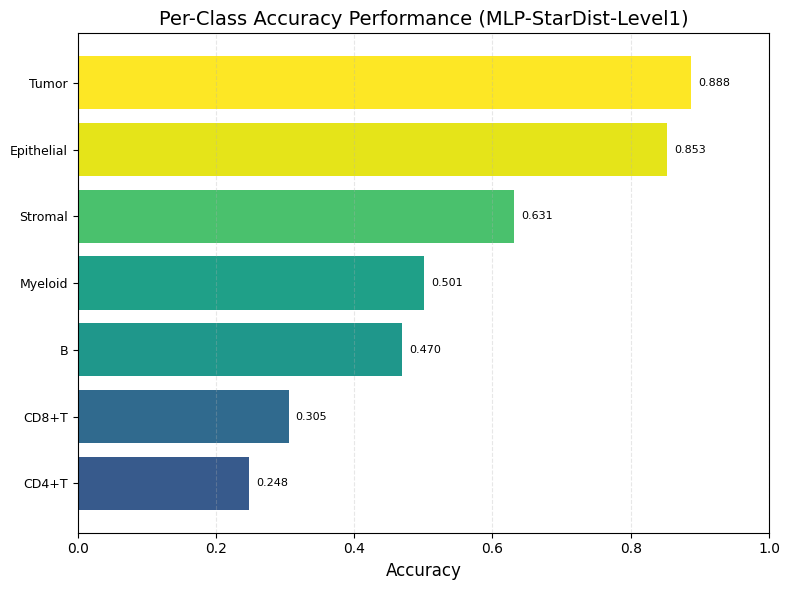


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 7
  Actual classes in test set: 7
  Model parameters: 1,726,788
  Test Accuracy: 0.5898
  Test Macro F1: 0.5487
  Test Weighted F1: 0.5798
  Level1 metrics from L1 head: acc=0.5847, macro_f1=0.5490, weighted_f1=0.5790
Visualizing per-class accuracy...
  ✓ Computed metrics for 7 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/acc_level1_stardist_L1head.pdf


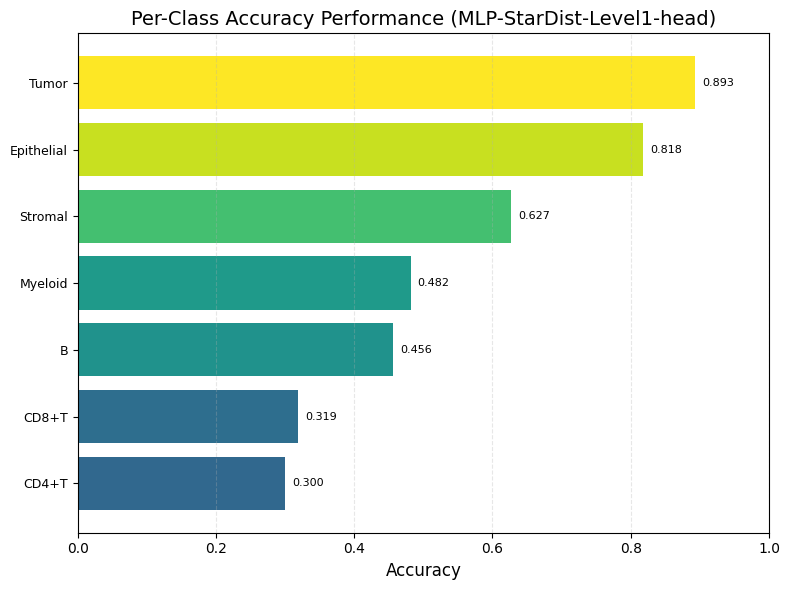


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 7
  Actual classes in test set: 7
  Model parameters: 1,726,788
  Test Accuracy: 0.5847
  Test Macro F1: 0.5490
  Test Weighted F1: 0.5790
  Ground-truth tier check (Level12 sublineage): ['B_other', 'B_plasma', 'CD4_Tconv', 'CD4_Treg', 'CD8_Effector', 'CD8_Other', 'Dendritic', 'Epithelial', 'Macrophage', 'Myeloid_other', 'Stromal_other', 'Tumor']

Level12 sublineage (StarDist): acc=0.5510, macro_f1=0.3874
Visualizing per-class accuracy...
  ✓ Computed metrics for 12 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/acc_level12_stardist.pdf


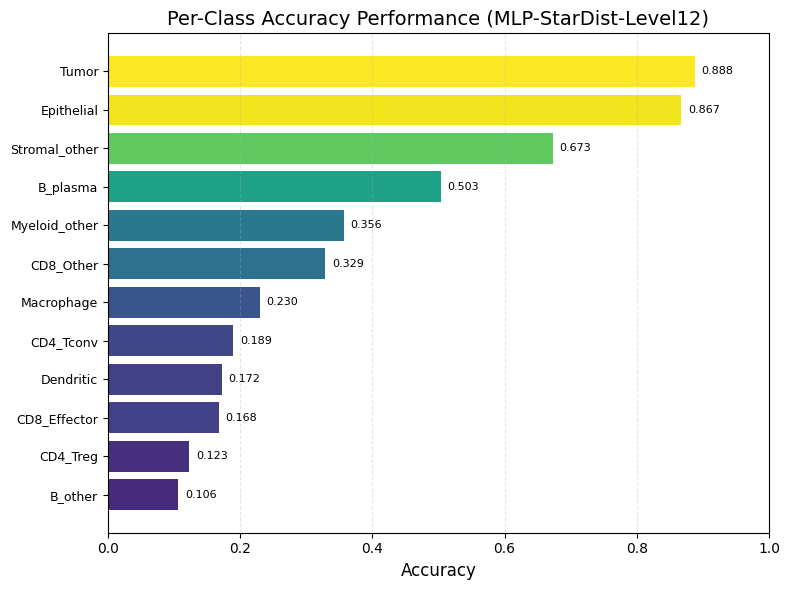


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 12
  Actual classes in test set: 12
  Model parameters: 1,726,788
  Test Accuracy: 0.5510
  Test Macro F1: 0.3874
  Test Weighted F1: 0.5315
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/acc_level12_stardist.pdf
  Ground-truth tier check (Level0 compartment): ['Epithelial', 'Immune', 'Stromal', 'Tumor']

Level0 compartment (StarDist): acc=0.7805, macro_f1=0.7649
Visualizing per-class accuracy...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/acc_level0_stardist.pdf


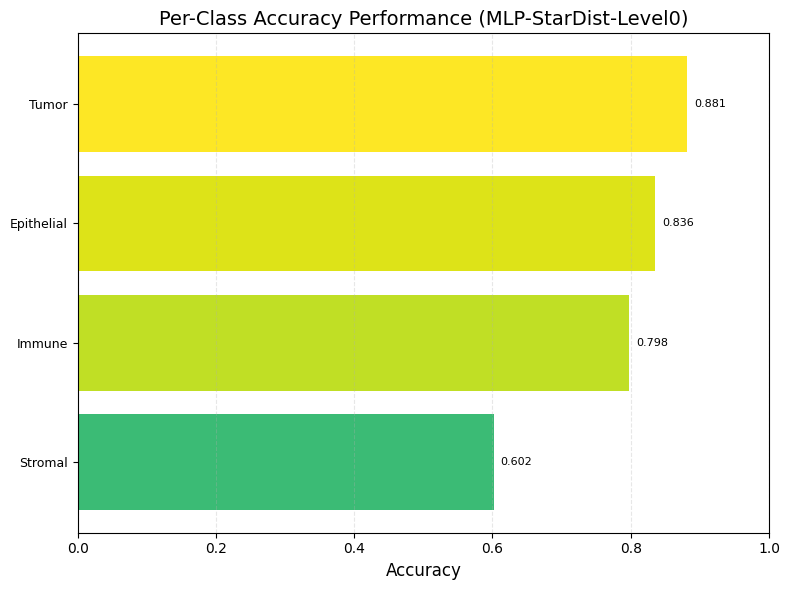


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Model parameters: 1,726,788
  Test Accuracy: 0.7805
  Test Macro F1: 0.7649
  Test Weighted F1: 0.7802
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/acc_level0_stardist.pdf
  Ground-truth tier check (Level01 bucket): ['B', 'Epithelial', 'Myeloid', 'Stromal', 'T', 'Tumor']

Level01 bucket (StarDist): acc=0.6270, macro_f1=0.6182
Visualizing per-class accuracy...
  ✓ Computed metrics for 6 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/acc_level01_stardist.pdf


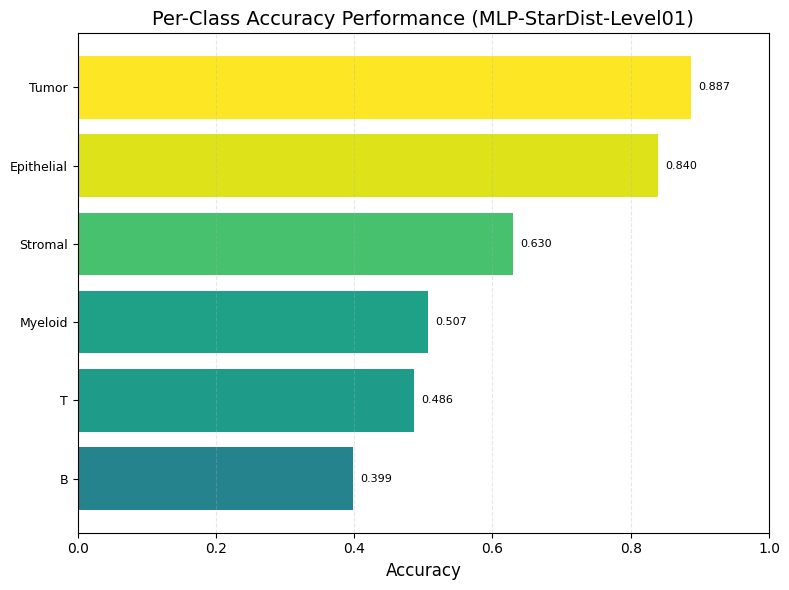


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 6
  Actual classes in test set: 6
  Model parameters: 1,726,788
  Test Accuracy: 0.6270
  Test Macro F1: 0.6182
  Test Weighted F1: 0.6219
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/acc_level01_stardist.pdf


In [30]:
## StarDist per-class accuracy — all tiers
ensure_stardist_hierarchy_labels(globals(), cv_data if "cv_data" in globals() else None)

_sn = globals().get("class_names_star")
class_names_star = class_names if _sn is None else _sn

plot_per_class_accuracy(
    all_labels, all_preds, class_names_star,
    model=model_star, device=device,
    test_acc=all_acc, test_macro_f1=all_macro_f1, test_weighted_f1=all_weighted_f1,
    model_name="MLP-StarDist-Level2", y_sort_by="acc_asc",
    save_path=result_fig("acc_level2_stardist"),
)
plot_level1_accuracy_from_level2_predictions(
    matched_features_path=matched_features_star_path, all_preds=all_preds,
    class_names=class_names_star, class_names_level1=class_names_level1,
    y_encoded_f=y_encoded_f, y_level1_encoded_f=y_level1_encoded_f,
    plot_per_class_accuracy=plot_per_class_accuracy,
    model=model_star, device=device,
    model_name="MLP-StarDist-Level1", y_sort_by="acc_asc",
    save_path=result_fig("acc_level1_stardist"),
)
plot_level1_accuracy_from_level1_head(
    matched_features_path=matched_features_star_path, model=model_star,
    device=device, scaler=scaler, class_names_level1=class_names_level1,
    plot_per_class_accuracy=plot_per_class_accuracy,
    model_name="MLP-StarDist-Level1-head", y_sort_by="acc_asc",
    save_path=result_fig("acc_level1_stardist_L1head"),
)
if hasattr(model_star, "level12_head"):
    _star_heads = stardist_head_preds(model_star, scaler, X_star, device, predict_all_label_heads)
    plot_stardist_acc_extra(plot_per_class_accuracy, result_fig, model_star, device, _star_heads, cv_data if "cv_data" in globals() else None, globals())
else:
    print("Skip StarDist Level12/Level0/Level01 accuracy: model_star is not five-head.")


Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level2_stardist.pdf


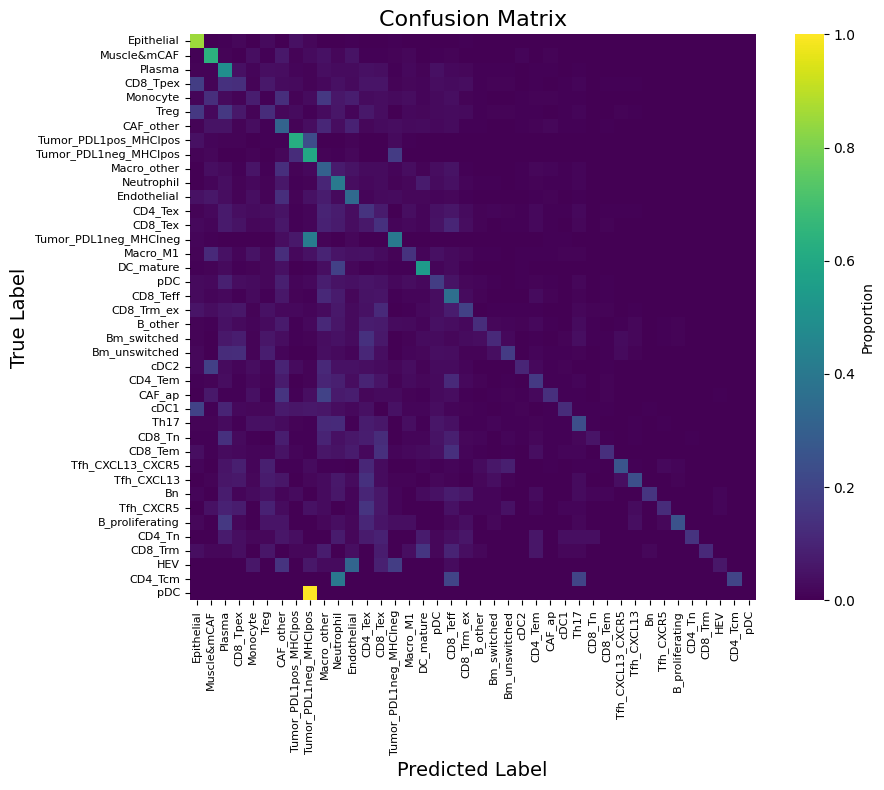

Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level1_stardist.pdf


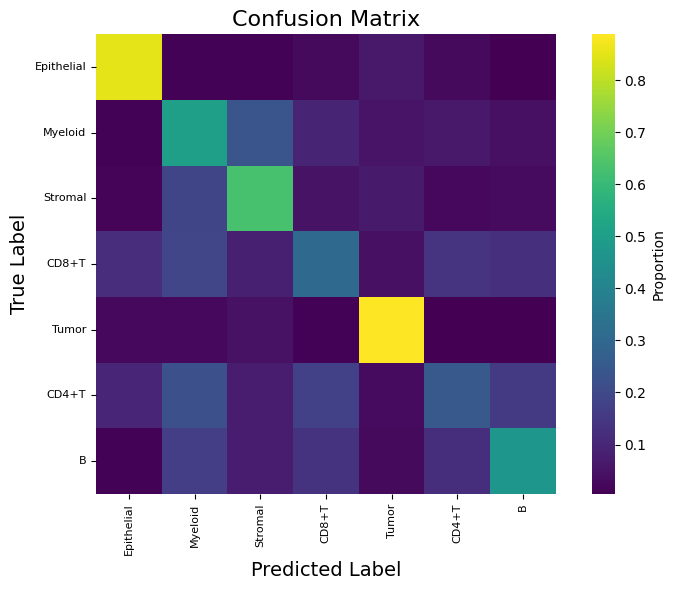

  Ground-truth tier check (Level12 sublineage): ['B_other', 'B_plasma', 'CD4_Tconv', 'CD4_Treg', 'CD8_Effector', 'CD8_Other', 'Dendritic', 'Epithelial', 'Macrophage', 'Myeloid_other', 'Stromal_other', 'Tumor']

Level12 sublineage (StarDist) confusion matrix
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level12_stardist.pdf


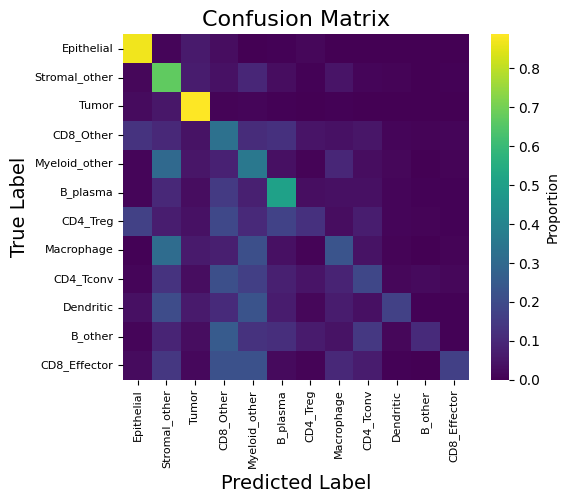

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level12_stardist.pdf
  Ground-truth tier check (Level0 compartment): ['Epithelial', 'Immune', 'Stromal', 'Tumor']

Level0 compartment (StarDist) confusion matrix
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level0_stardist.pdf


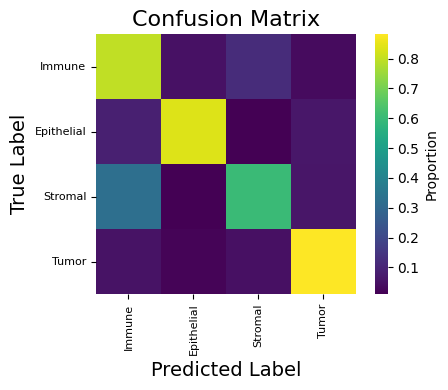

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level0_stardist.pdf
  Ground-truth tier check (Level01 bucket): ['B', 'Epithelial', 'Myeloid', 'Stromal', 'T', 'Tumor']

Level01 bucket (StarDist) confusion matrix
Computing confusion matrix...
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level01_stardist.pdf


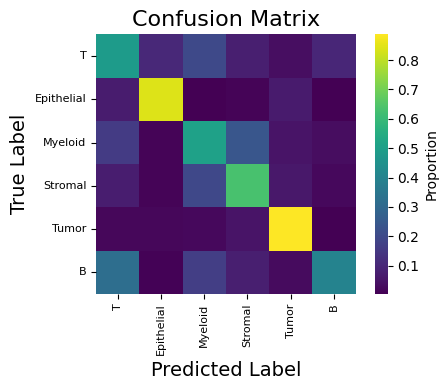

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/conf_matrix_level01_stardist.pdf


In [31]:
## StarDist confusion matrices — all tiers
ensure_stardist_hierarchy_labels(globals(), cv_data if "cv_data" in globals() else None)
import numpy as np

_sn = globals().get("class_names_star")
class_names_star = class_names if _sn is None else _sn

plot_confusion_matrix(
    all_labels, all_preds, class_names_star,
    figsize=(10, 8), save_path=result_fig("conf_matrix_level2_stardist"),
)

_loaded_star = np.load(matched_features_star_path, allow_pickle=True)
if "y_level1" in _loaded_star:
    _y_true_l1_raw = _loaded_star["y_level1"]
    _child_to_parent = np.full(len(class_names_star), -1, dtype=np.int64)
    for _l2, _l1 in zip(y_encoded_f, y_level1_encoded_f):
        _l2_i, _l1_i = int(_l2), int(_l1)
        if _child_to_parent[_l2_i] == -1:
            _child_to_parent[_l2_i] = _l1_i
    _preds_l1 = _child_to_parent[np.asarray(all_preds, dtype=np.int64)]
    _name_to_idx = {str(c): i for i, c in enumerate(class_names_level1)}
    _y_true_l1 = np.array([_name_to_idx.get(str(v), -1) for v in _y_true_l1_raw], dtype=np.int64)
    _n = min(len(_y_true_l1), len(_preds_l1))
    _valid = _y_true_l1[:_n] >= 0
    if np.any(_valid):
        plot_confusion_matrix(
            _y_true_l1[:_n][_valid], _preds_l1[:_n][_valid], class_names_level1,
            figsize=(8, 6), save_path=result_fig("conf_matrix_level1_stardist"),
        )

if hasattr(model_star, "level12_head"):
    _star_heads = stardist_head_preds(model_star, scaler, X_star, device, predict_all_label_heads)
    plot_stardist_confusion_extra(plot_confusion_matrix, result_fig, _star_heads, cv_data if "cv_data" in globals() else None, globals())


Visualizing per-class performance...
  ✓ Computed metrics for 40 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_level2_stardist.pdf


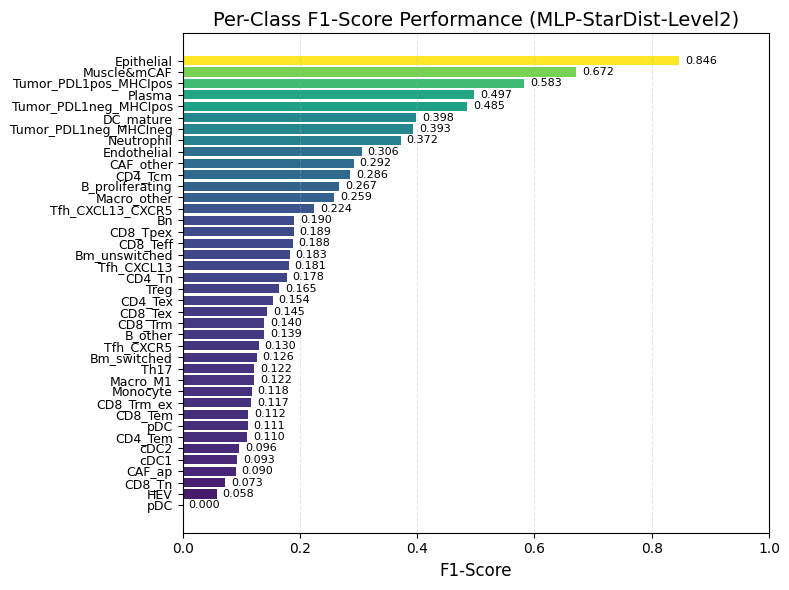


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 39
  Actual classes in test set: 40
  Model parameters: 1,726,788
  Test Accuracy: 0.4425
  Test Macro F1: 0.2362
  Test Weighted F1: 0.4358
  Level1 F1 plot from level2 preds (same mapping as accuracy helper): acc=0.5898, macro_f1=0.5487, weighted_f1=0.5798
Visualizing per-class performance...
  ✓ Computed metrics for 7 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_level1_stardist.pdf


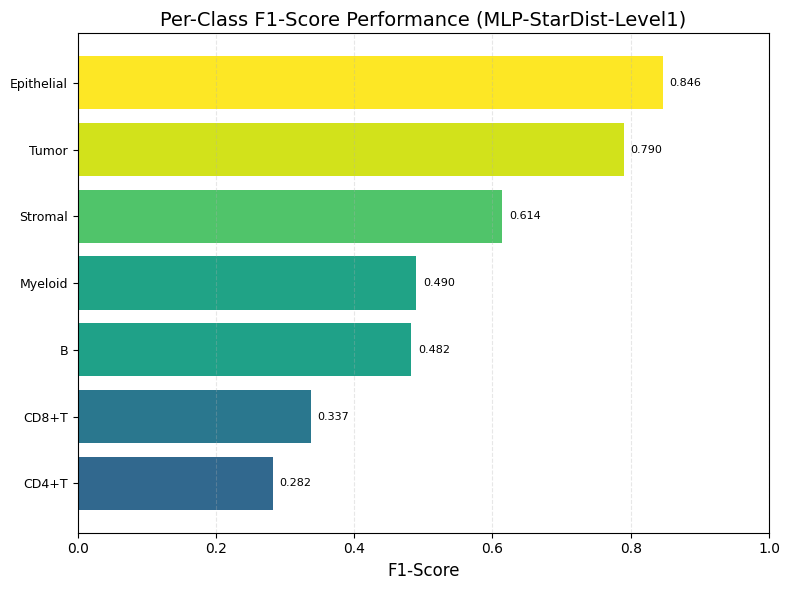


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 7
  Actual classes in test set: 7
  Model parameters: 1,726,788
  Test Accuracy: 0.5898
  Test Macro F1: 0.5487
  Test Weighted F1: 0.5798
  Level1 F1 plot from L1 head: acc=0.5847, macro_f1=0.5490, weighted_f1=0.5790
Visualizing per-class performance...
  ✓ Computed metrics for 7 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_level1_stardist_L1head.pdf


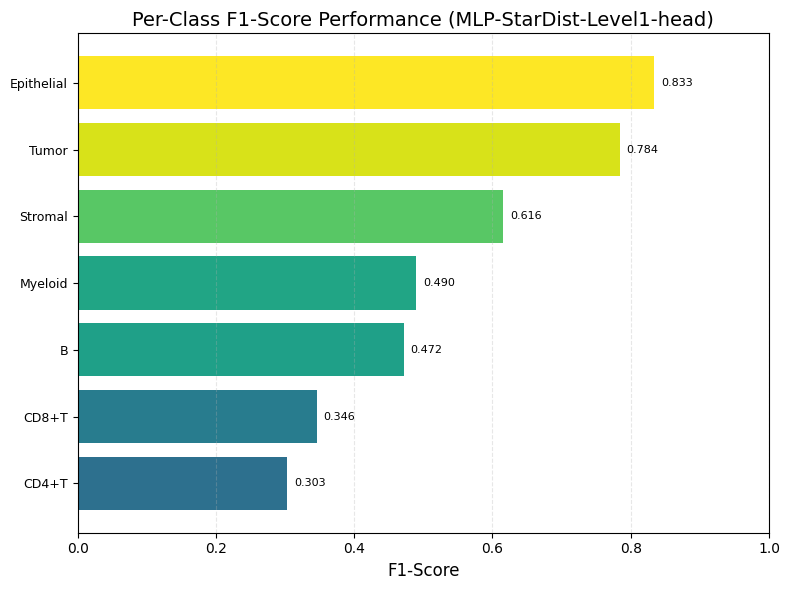


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 7
  Actual classes in test set: 7
  Model parameters: 1,726,788
  Test Accuracy: 0.5847
  Test Macro F1: 0.5490
  Test Weighted F1: 0.5790
  Ground-truth tier check (Level12 sublineage): ['B_other', 'B_plasma', 'CD4_Tconv', 'CD4_Treg', 'CD8_Effector', 'CD8_Other', 'Dendritic', 'Epithelial', 'Macrophage', 'Myeloid_other', 'Stromal_other', 'Tumor']

Level12 sublineage (StarDist) per-class F1
Visualizing per-class performance...
  ✓ Computed metrics for 12 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_level12_stardist.pdf


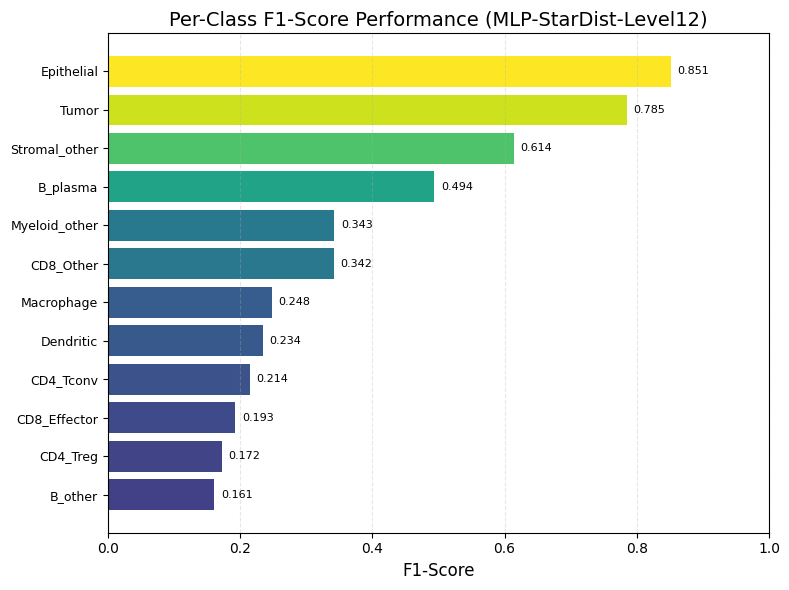


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 12
  Actual classes in test set: 12
  Model parameters: 1,726,788
  Test Accuracy: 0.5510
  Test Macro F1: 0.3874
  Test Weighted F1: 0.5315
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_level12_stardist.pdf
  Ground-truth tier check (Level0 compartment): ['Epithelial', 'Immune', 'Stromal', 'Tumor']

Level0 compartment (StarDist) per-class F1
Visualizing per-class performance...
  ✓ Computed metrics for 4 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_level0_stardist.pdf


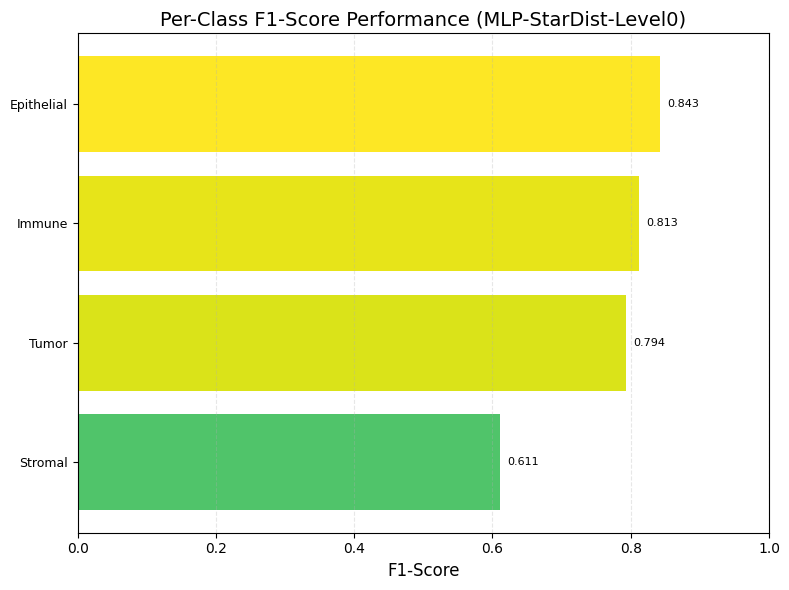


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 4
  Actual classes in test set: 4
  Model parameters: 1,726,788
  Test Accuracy: 0.7805
  Test Macro F1: 0.7649
  Test Weighted F1: 0.7802
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_level0_stardist.pdf
  Ground-truth tier check (Level01 bucket): ['B', 'Epithelial', 'Myeloid', 'Stromal', 'T', 'Tumor']

Level01 bucket (StarDist) per-class F1
Visualizing per-class performance...
  ✓ Computed metrics for 6 classes
Figure saved to /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_level01_stardist.pdf


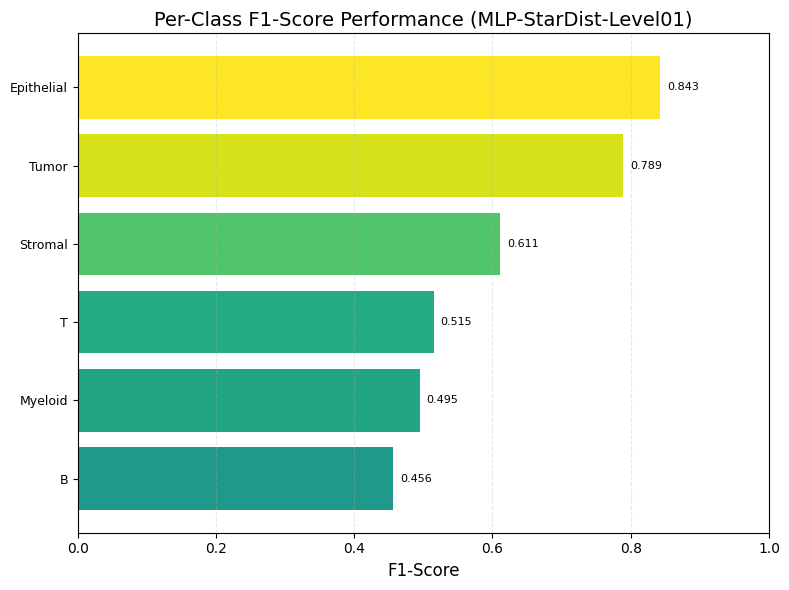


Model Summary:
  Device: cuda:0
  Total classes (before filtering): 6
  Actual classes in test set: 6
  Model parameters: 1,726,788
  Test Accuracy: 0.6270
  Test Macro F1: 0.6182
  Test Weighted F1: 0.6219
Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/f1_level01_stardist.pdf


In [32]:
## StarDist per-class F1 — all tiers
ensure_stardist_hierarchy_labels(globals(), cv_data if "cv_data" in globals() else None)
_sn = globals().get("class_names_star")
class_names_star = class_names if _sn is None else _sn

plot_per_class_f1(
    all_labels, all_preds, class_names_star,
    model=model_star, device=device,
    test_acc=all_acc, test_macro_f1=all_macro_f1, test_weighted_f1=all_weighted_f1,
    y_sort_by="f1_asc", model_name="MLP-StarDist-Level2",
    save_path=result_fig("f1_level2_stardist"),
)
plot_level1_f1_from_level2_predictions(
    matched_features_path=matched_features_star_path, all_preds=all_preds,
    class_names=class_names_star, class_names_level1=class_names_level1,
    y_encoded_f=y_encoded_f, y_level1_encoded_f=y_level1_encoded_f,
    plot_per_class_f1=plot_per_class_f1, model=model_star, device=device,
    y_sort_by="f1_asc", model_name="MLP-StarDist-Level1",
    save_path=result_fig("f1_level1_stardist"),
)
plot_level1_f1_from_level1_head(
    matched_features_path=matched_features_star_path, model=model_star,
    device=device, scaler=scaler, class_names_level1=class_names_level1,
    plot_per_class_f1=plot_per_class_f1,
    y_sort_by="f1_asc", model_name="MLP-StarDist-Level1-head",
    save_path=result_fig("f1_level1_stardist_L1head"),
)
if hasattr(model_star, "level12_head"):
    _star_heads = stardist_head_preds(model_star, scaler, X_star, device, predict_all_label_heads)
    plot_stardist_f1_extra(plot_per_class_f1, result_fig, model_star, device, _star_heads, cv_data if "cv_data" in globals() else None, globals())


  ROC colors: ncrt / celltype (aligned with spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_stardist_level2.pdf


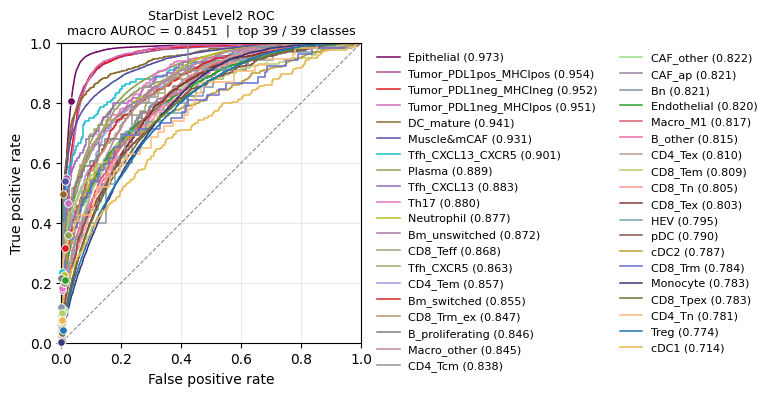

  ROC colors: ncrt / celltype_level1 (aligned with spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_stardist_level1.pdf


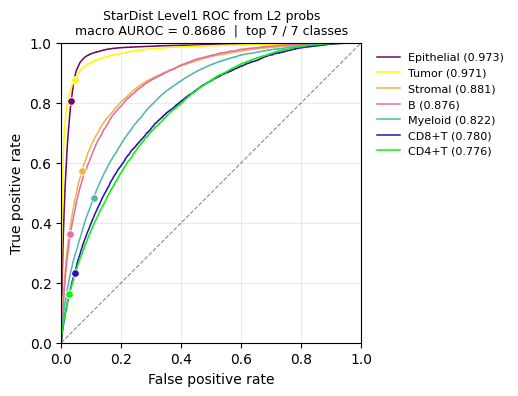

  ROC colors: ncrt / celltype_level1 (aligned with spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_stardist_level1_L1head.pdf


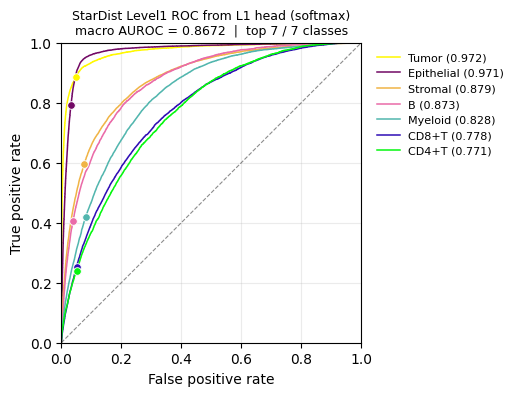


Level12 sublineage (StarDist) ROC — ground truth labels: ['B_other', 'B_plasma', 'CD4_Tconv', 'CD4_Treg', 'CD8_Effector', 'CD8_Other', 'Dendritic', 'Epithelial', 'Macrophage', 'Myeloid_other', 'Stromal_other', 'Tumor']
  ROC colors: ncrt / celltype_level12 (aligned with spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_stardist_level12.pdf


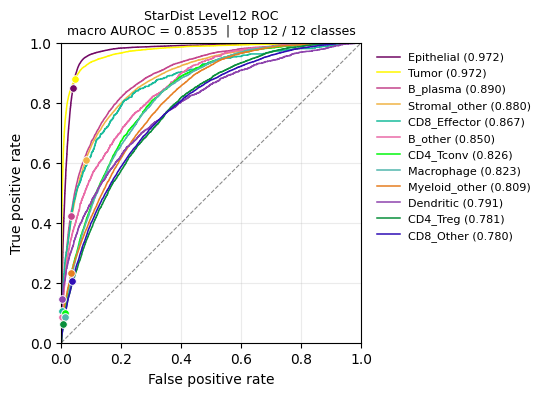

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_stardist_level12.pdf

Level0 compartment (StarDist) ROC — ground truth labels: ['Epithelial', 'Immune', 'Stromal', 'Tumor']
  ROC colors: ncrt / celltype_level0 (aligned with spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_stardist_level0.pdf


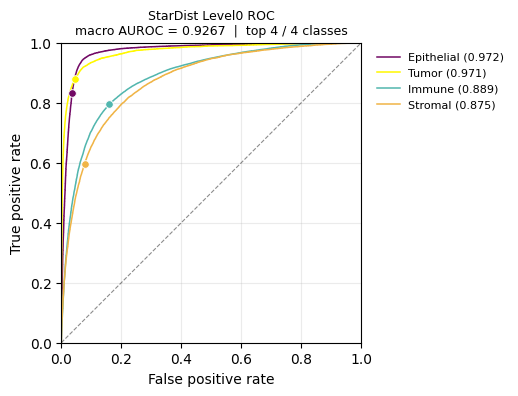

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_stardist_level0.pdf
Skip Level01 bucket ROC: y_star_level4 has Level01 labels ['B', 'Epithelial', 'Myeloid', 'Stromal', 'T', 'Tumor']. Call ensure_stardist_hierarchy_labels() after StarDist match.


In [25]:
## StarDist ROC — all label tiers (L2 / L1 / L12 / Level0 / Level01)
import numpy as np

_sn = globals().get("class_names_star")
class_names_star = class_names if _sn is None else _sn

ensure_stardist_hierarchy_labels(globals(), cv_data if "cv_data" in globals() else None)

_z = np.load(matched_features_star_path)
X_star_scaled = scaler.transform(_z["X"])
probs_l2 = mlp_collect_softmax_probs(model_star, X_star_scaled, device)

if all_labels is None:
    print("Skip ROC: no ground-truth labels (all_labels is None).")
else:
    m = min(len(probs_l2), len(all_labels))
    plot_multiclass_roc_curves(
        all_labels[:m], probs_l2[:m], class_names_star,
        figsize=(3.0, 3.0), max_curves=len(class_names_star),
        save_path=result_fig("roc_stardist_level2"),
        title="StarDist Level2 ROC", roc_color_scheme="ncrt",
    )
    plot_level1_roc_from_level2_scores(
        matched_features_star_path, probs_l2[:m],
        class_names_star, class_names_level1,
        y_encoded_f, y_level1_encoded_f,
        figsize=(3.0, 3.0),
        save_path=result_fig("roc_stardist_level1"),
        title="StarDist Level1 ROC from L2 probs", roc_color_scheme="ncrt",
    )
    plot_level1_roc_from_level1_head(
        matched_features_star_path, model_star, device, scaler,
        class_names_level1, figsize=(3.0, 3.0), n_rows_max=m,
        save_path=result_fig("roc_stardist_level1_L1head"),
        title="StarDist Level1 ROC from L1 head (softmax)", roc_color_scheme="ncrt",
    )
    if hasattr(model_star, "level12_head"):
        _probs_heads = mlp_collect_five_head_softmax_probs(model_star, X_star_scaled, device)
        plot_stardist_roc_extra(
            plot_multiclass_roc_curves, result_fig, _probs_heads,
            cv_data if "cv_data" in globals() else None, m, globals(),
        )
    else:
        print("Skip StarDist Level12/Level0/Level01 ROC: model_star is not five-head.")


  ROC colors: ncrt / celltype (aligned with spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_level2.pdf


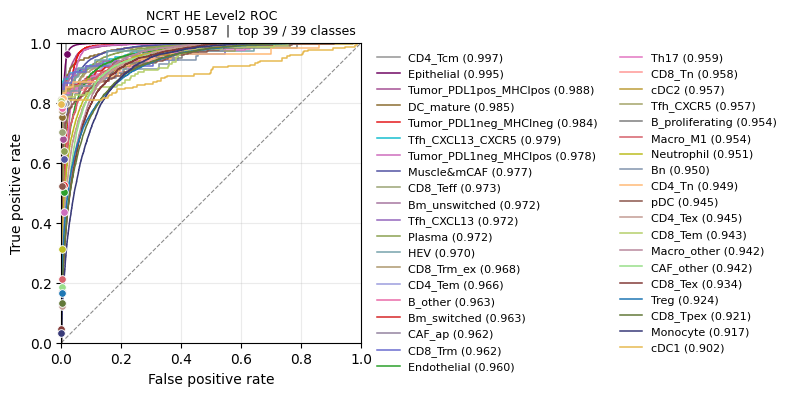

  ROC colors: ncrt / celltype_level1 (aligned with spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_level1.pdf


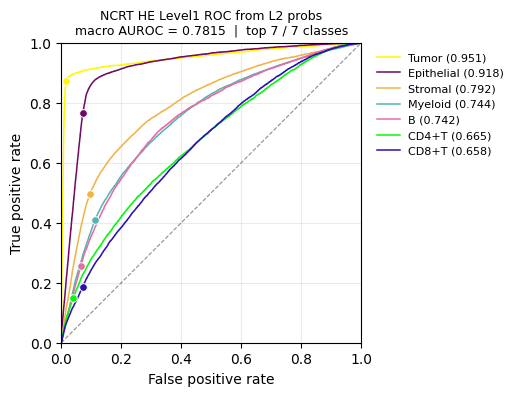

  ROC colors: ncrt / celltype_level1 (aligned with spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_level1_L1head.pdf


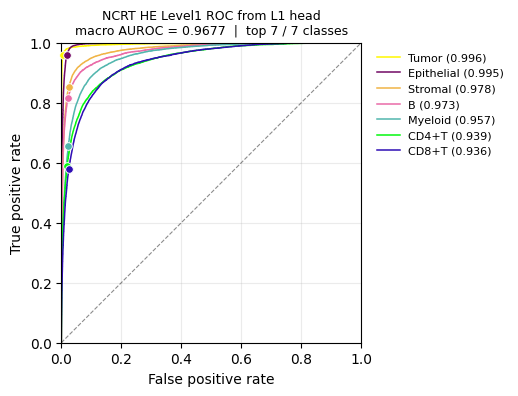


Level12 sublineage (HE in-sample) ROC
  ROC colors: ncrt / celltype_level12 (aligned with spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_level12.pdf


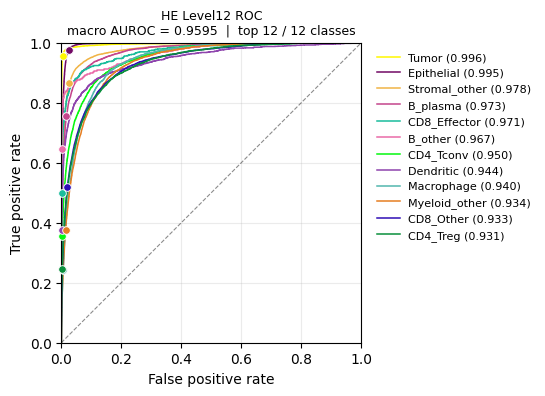

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_level12.pdf

Level0 compartment (HE in-sample) ROC
  ROC colors: ncrt / celltype_level0 (aligned with spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_level0.pdf


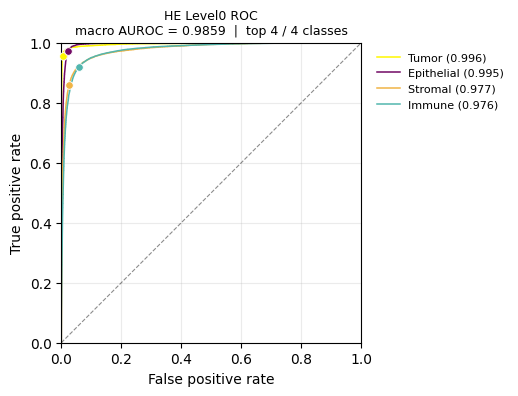

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_level0.pdf

Level01 bucket (HE in-sample) ROC
  ROC colors: ncrt / celltype_level01 (aligned with spatial palette).
  ✓ Saved ROC figure: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_level01.pdf


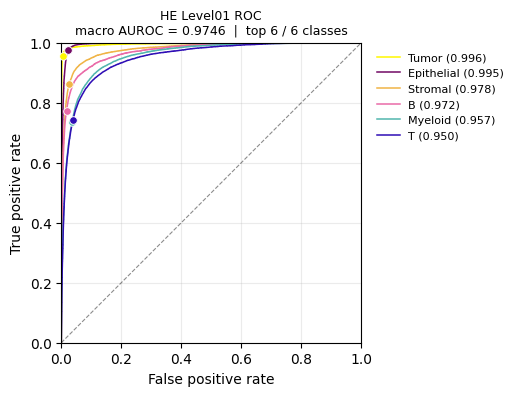

Saved: /home/lingyu/ssd2/Python/Collaborate/esccAI/data/NCRT/NCRT_project_tumor1_UNI/result/roc_level01.pdf


In [26]:
## HE in-sample ROC — all label tiers (L2 / L1 / L12 / Level0 / Level01)
import numpy as np

ensure_lp_extra_insample_preds(
    model, scaler, cv_data, device, predict_all_label_heads, globals(),
)

if val_labels is None:
    print("Skip HE ROC: no val_labels (re-run ablation / insample eval).")
else:
    X_he_scaled = scaler.transform(cv_data["X_f"])
    probs_l2_he = mlp_collect_softmax_probs(model, X_he_scaled, device)
    m_he = min(len(probs_l2_he), len(val_labels))

    plot_multiclass_roc_curves(
        val_labels[:m_he], probs_l2_he[:m_he], class_names,
        figsize=(3.0, 3.0), max_curves=len(class_names),
        save_path=result_fig("roc_level2"),
        title=f"{therapy_data} HE Level2 ROC", roc_color_scheme="ncrt",
    )
    plot_level1_roc_from_level2_scores(
        matched_features_path, probs_l2_he[:m_he],
        class_names, class_names_level1,
        y_encoded_f, y_level1_encoded_f,
        figsize=(3.0, 3.0),
        save_path=result_fig("roc_level1"),
        title=f"{therapy_data} HE Level1 ROC from L2 probs", roc_color_scheme="ncrt",
    )
    plot_level1_roc_from_level1_head(
        matched_features_path, model, device, scaler,
        class_names_level1, figsize=(3.0, 3.0), n_rows_max=m_he,
        save_path=result_fig("roc_level1_L1head"),
        title=f"{therapy_data} HE Level1 ROC from L1 head", roc_color_scheme="ncrt",
    )
    if hasattr(model, "level12_head"):
        _he_probs = mlp_collect_five_head_softmax_probs(model, X_he_scaled, device)
        plot_he_roc_extra(
            plot_multiclass_roc_curves, result_fig, _he_probs,
            cv_data if "cv_data" in globals() else None, globals(),
        )
    else:
        print("Skip HE Level12/Level0/Level01 ROC: model is not five-head.")
